References
* https://www.youtube.com/playlist?list=PLIUOU7oqGTLieV9uTIFMm6_4PXg-hlN6F
* https://www.youtube.com/watch?v=a89vqgK-Qcs

Each top level chapter can be executed standalone assuming that Prerequisites executed already.


#### Limiting examples

In [ ]:
from langchain.prompts.example_selector import LengthBasedExampleSelector

example_selector = LengthBasedExampleSelector(
    examples=examples,
    example_prompt=fs_template,
    max_length=50
)

In [ ]:
few_shot_prompt_template = FewShotPromptTemplate(
    example_selector=example_selector,
    example_prompt=fs_template,
    prefix=prefix,
    suffix=suffix,
    input_variables=["query"],
    example_separator="\n"
)

We could use SimilarityBasedExampleSelector as well

### Output Parsing

In [ ]:
from langchain.output_parsers import ResponseSchema
from langchain.output_parsers import StructuredOutputParser

sentiment_schema = ResponseSchema(name="sentiment", description = "Is the text is positive, neutral or negative. Only provide one of these words")
subject_schema = ResponseSchema(name="subject", description = "What's the subject of text with one word")
price_schema = ResponseSchema(name="price", description = "Price of the product. Set to 0 if no price mentioned in the text")

response_schemas = [sentiment_schema, subject_schema, price_schema]

parser = StructuredOutputParser.from_response_schemas(response_schemas)
format_instructions = parser.get_format_instructions()
print(format_instructions)

The output should be a markdown code snippet formatted in the following schema, including the leading and trailing "```json" and "```":

```json
{
	"sentiment": string  // Is the text is positive, neutral or negative. Only provide one of these words
	"subject": string  // What's the subject of text with one word
	"price": string  // Price of the product. Set to 0 if no price mentioned in the text
}
```


#### Injecting to Prompts

This creates a ChatPromptTemplate instance with one HumanMessagePromptTemplate

In [ ]:
from langchain.prompts import ChatPromptTemplate
template_str = """
Understand the text

text: {input}

{format_instructions}
"""
template = ChatPromptTemplate.from_template(template_str)
template

ChatPromptTemplate(input_variables=['format_instructions', 'input'], messages=[HumanMessagePromptTemplate(prompt=PromptTemplate(input_variables=['format_instructions', 'input'], template='\nUnderstand the text\n\ntext: {input}\n\n{format_instructions}\n'))])

This fills the template in a ChatPromptValue instances. Messages can be accessed with to_messages() or .messages

In [ ]:
messages = template.format_messages(input="I got a new headset and the bass sounds great", format_instructions=parser.get_format_instructions())
messages

[HumanMessage(content='\nUnderstand the text\n\ntext: I got a new headset and the bass sounds great\n\nThe output should be a markdown code snippet formatted in the following schema, including the leading and trailing "```json" and "```":\n\n```json\n{\n\t"sentiment": string  // Is the text is positive, neutral or negative. Only provide one of these words\n\t"subject": string  // What\'s the subject of text with one word\n\t"price": string  // Price of the product. Set to 0 if no price mentioned in the text\n}\n```\n')]

In [ ]:
print(messages[0].content)


Understand the text

text: I got a new headset and the bass sounds great

The output should be a markdown code snippet formatted in the following schema, including the leading and trailing "```json" and "```":

```json
{
	"sentiment": string  // Is the text is positive, neutral or negative. Only provide one of these words
	"subject": string  // What's the subject of text with one word
	"price": string  // Price of the product. Set to 0 if no price mentioned in the text
}
```



As shown below, chains know how to call automatically.

#### via chain

In [9]:
from langchain.chains import LLMChain
from langchain_openai import ChatOpenAI

chat_llm = ChatOpenAI()

In [ ]:
chain = LLMChain(llm=chat_llm, prompt=template)
response = chain.invoke({"input":"I got a new headset and the bass sounds great. It's very cheap as well",
                            "format_instructions":parser.get_format_instructions()})
print(response['text'])

```json
{
	"sentiment": "positive",
	"subject": "headset",
	"price": "cheap"
}
```


or

In [ ]:
response = chain.predict(input="I got a new headset and the bass sounds great. It's very cheap as well",
                            format_instructions=parser.get_format_instructions())
print(response)

```json
{
	"sentiment": "positive",
	"subject": "headset",
	"price": "cheap"
}
```


#### End2End

##### Converting to native type

In [ ]:
response

'```json\n{\n\t"sentiment": "positive",\n\t"subject": "headset",\n\t"price": "cheap"\n}\n```'

In [ ]:
parser.parse(response) # returns dictionary

{'sentiment': 'positive', 'subject': 'headset', 'price': 'cheap'}

However we can combine above as well all together

In [ ]:
from langchain_core.prompts import HumanMessagePromptTemplate

template = ChatPromptTemplate(
    messages = [HumanMessagePromptTemplate.from_template(template_str)]
)
template

ChatPromptTemplate(input_variables=['format_instructions', 'input'], messages=[HumanMessagePromptTemplate(prompt=PromptTemplate(input_variables=['format_instructions', 'input'], template='\nUnderstand the text\n\ntext: {input}\n\n{format_instructions}\n'))])

##### Partial variable

However with the following parameters, we simplify the things. Instead of making both "input" and "format_instructions" implicitly input_variables, we specify one of them really input and other is partial variable which is constant for the prompt. This way we embed the instructions before and specify the output to be parsed as we wish

In [ ]:
template = ChatPromptTemplate(
    messages = [HumanMessagePromptTemplate.from_template(template_str)],
    input_variables=["input"],
    partial_variables={"format_instructions":format_instructions}
)
template

ChatPromptTemplate(input_variables=['input'], partial_variables={'format_instructions': 'The output should be a markdown code snippet formatted in the following schema, including the leading and trailing "```json" and "```":\n\n```json\n{\n\t"sentiment": string  // Is the text is positive, neutral or negative. Only provide one of these words\n\t"subject": string  // What\'s the subject of text with one word\n\t"price": string  // Price of the product. Set to 0 if no price mentioned in the text\n}\n```'}, messages=[HumanMessagePromptTemplate(prompt=PromptTemplate(input_variables=['format_instructions', 'input'], template='\nUnderstand the text\n\ntext: {input}\n\n{format_instructions}\n'))])

In [ ]:
# as an example, see how it works:
template.format(input="I purchased this cheap headset but it sounds great")

'Human: \nUnderstand the text\n\ntext: I purchased this cheap headset but it sounds great\n\nThe output should be a markdown code snippet formatted in the following schema, including the leading and trailing "```json" and "```":\n\n```json\n{\n\t"sentiment": string  // Is the text is positive, neutral or negative. Only provide one of these words\n\t"subject": string  // What\'s the subject of text with one word\n\t"price": string  // Price of the product. Set to 0 if no price mentioned in the text\n}\n```\n'

##### Chaining

In [ ]:
from langchain.chains import LLMChain

chain = LLMChain(llm=chat_llm, prompt=template, output_parser=parser)

In [ ]:
chain.invoke("I love the new washing machine. It costed 300$.")

{'input': 'I love the new washing machine. It costed 300$.',
 'text': {'sentiment': 'positive',
  'subject': 'washing machine',
  'price': '300$'}}

#### Pydantic

With Pydantic, we can guarantee that the output will be an instance of our class

In [ ]:
from langchain.output_parsers import PydanticOutputParser
from pydantic import BaseModel, Field, validator

chat_llm = ChatOpenAI(temperature=.0)

class ReviewInfo(BaseModel):
    review: str = Field("Sentiment of the review text. This is one of 'positive', 'neutral' or 'negative'")
    subject: str = Field("Subject mentioned in the review text")
    price: int = Field("Price of purchased product in review")
    num_stars: int = Field("Possible rate value of review between 1-5 where 5 is the best")

    @validator('num_stars')
    def check_price(cls, field):
        if field > 5:
            raise ValueError("Badly formed num of stars")
        return field

In [ ]:
pydantic_parser = PydanticOutputParser(pydantic_object=ReviewInfo)
format_instructions = pydantic_parser.get_format_instructions()
print(format_instructions)

The output should be formatted as a JSON instance that conforms to the JSON schema below.

As an example, for the schema {"properties": {"foo": {"title": "Foo", "description": "a list of strings", "type": "array", "items": {"type": "string"}}}, "required": ["foo"]}
the object {"foo": ["bar", "baz"]} is a well-formatted instance of the schema. The object {"properties": {"foo": ["bar", "baz"]}} is not well-formatted.

Here is the output schema:
```
{"properties": {"review": {"title": "Review", "default": "Sentiment of the review text. This is one of 'positive', 'neutral' or 'negative'", "type": "string"}, "subject": {"title": "Subject", "default": "Subject mentioned in the review text", "type": "string"}, "price": {"title": "Price", "default": "Price of purchased product in review", "type": "integer"}, "num_stars": {"title": "Num Stars", "default": "Possible rate value of review between 1-5 where 5 is the best", "type": "integer"}}}
```


In [ ]:
template = ChatPromptTemplate.from_template(template=template_str)

messages = template.format_messages(input="I love the headset, it's very good for this 10$ price",
                                  format_instructions=format_instructions)
messages

[HumanMessage(content='\nUnderstand the text\n\ntext: I love the headset, it\'s very good for this 10$ price\n\nThe output should be formatted as a JSON instance that conforms to the JSON schema below.\n\nAs an example, for the schema {"properties": {"foo": {"title": "Foo", "description": "a list of strings", "type": "array", "items": {"type": "string"}}}, "required": ["foo"]}\nthe object {"foo": ["bar", "baz"]} is a well-formatted instance of the schema. The object {"properties": {"foo": ["bar", "baz"]}} is not well-formatted.\n\nHere is the output schema:\n```\n{"properties": {"review": {"title": "Review", "default": "Sentiment of the review text. This is one of \'positive\', \'neutral\' or \'negative\'", "type": "string"}, "subject": {"title": "Subject", "default": "Subject mentioned in the review text", "type": "string"}, "price": {"title": "Price", "default": "Price of purchased product in review", "type": "integer"}, "num_stars": {"title": "Num Stars", "default": "Possible rate v

In [ ]:
response=chat_llm.invoke(messages)
print(response.content)

{
  "review": "positive",
  "subject": "headset",
  "price": 10,
  "num_stars": 5
}


In [ ]:
review = pydantic_parser.parse(response.content)
type(review)

__main__.ReviewInfo

In [ ]:
s='''
{
  "review": "positive",
  "subject": "headset",
  "price": 10,
  "num_stars": 6
}'''

In [ ]:
# this will trigger an error
pydantic_parser.parse(s)

OutputParserException: Failed to parse ReviewInfo from completion {"review": "positive", "subject": "headset", "price": 10, "num_stars": 6}. Got: 1 validation error for ReviewInfo
num_stars
  Badly formed num of stars (type=value_error)

#### Structured Output

In [8]:
from langchain_core.pydantic_v1 import BaseModel, Field


class Joke(BaseModel):
    setup: str = Field(description="The setup of the joke")
    punchline: str = Field(description="The punchline to the joke")

In [15]:
structured_llm = chat_llm.with_structured_output(Joke)
structured_llm

RunnableBinding(bound=ChatOpenAI(client=<openai.resources.chat.completions.Completions object at 0x0000024FFD7ECFA0>, async_client=<openai.resources.chat.completions.AsyncCompletions object at 0x0000024FFD7EE6B0>, openai_api_key=SecretStr('**********'), openai_proxy=''), kwargs={'tools': [{'type': 'function', 'function': {'name': 'Joke', 'description': '', 'parameters': {'type': 'object', 'properties': {'setup': {'description': 'The setup of the joke', 'type': 'string'}, 'punchline': {'description': 'The punchline to the joke', 'type': 'string'}}, 'required': ['setup', 'punchline']}}}], 'tool_choice': {'type': 'function', 'function': {'name': 'Joke'}}})
| PydanticToolsParser(first_tool_only=True, tools=[<class '__main__.Joke'>])

In [16]:
structured_llm.invoke("Tell me a joke about Elon Musk")

Joke(setup='Why did the physics teacher break up with Elon Musk?', punchline='He had too much potential but no kinetic energy.')

#### Fixing errors

PydanticParser will handle type conversions like converting "10" to 10 based on given type. But still errors may occur and we can fix them automatically.

In [ ]:
from langchain.output_parsers import OutputFixingParser

new_parser = OutputFixingParser.from_llm(parser=pydantic_parser, llm=ChatOpenAI())

In [ ]:
s='''
{
  "review": "positive",
  "subject": "headset",
  "price": 10,
  "num_stars": 6
}'''

In [ ]:
new_parser.parse(s)

ReviewInfo(review='positive', subject='headset', price=10, num_stars=5)

How it works?

In [ ]:
print(new_parser.retry_chain.prompt.template)

Instructions:
--------------
{instructions}
--------------
Completion:
--------------
{completion}
--------------

Above, the Completion did not satisfy the constraints given in the Instructions.
Error:
--------------
{error}
--------------

Please try again. Please only respond with an answer that satisfies the constraints laid out in the Instructions:


Similarly there exists, RetryWithErrorOutputParser

### More on chains

#### Deep dive

In [ ]:
from langchain.chains import LLMMathChain
from langchain_openai  import OpenAI,ChatOpenAI

llm = OpenAI()
llm_math = LLMMathChain.from_llm(llm=llm, verbose=True)

In [ ]:
llm_math.invoke("What is 13 raised to the power 0.332")



> Entering new LLMMathChain chain...
What is 13 raised to the power 0.332```text
13**(0.332)
```
...numexpr.evaluate("13**(0.332)")...

Answer: 2.3433070167294567
> Finished chain.


{'question': 'What is 13 raised to the power 0.332',
 'answer': 'Answer: 2.3433070167294567'}

See prompt template of chain

In [ ]:
llm_math

LLMMathChain(verbose=True, llm_chain=LLMChain(prompt=PromptTemplate(input_variables=['question'], template='Translate a math problem into a expression that can be executed using Python\'s numexpr library. Use the output of running this code to answer the question.\n\nQuestion: ${{Question with math problem.}}\n```text\n${{single line mathematical expression that solves the problem}}\n```\n...numexpr.evaluate(text)...\n```output\n${{Output of running the code}}\n```\nAnswer: ${{Answer}}\n\nBegin.\n\nQuestion: What is 37593 * 67?\n```text\n37593 * 67\n```\n...numexpr.evaluate("37593 * 67")...\n```output\n2518731\n```\nAnswer: 2518731\n\nQuestion: 37593^(1/5)\n```text\n37593**(1/5)\n```\n...numexpr.evaluate("37593**(1/5)")...\n```output\n8.222831614237718\n```\nAnswer: 8.222831614237718\n\nQuestion: {question}\n'), llm=OpenAI(client=<openai.resources.completions.Completions object at 0x7d5d615b9330>, async_client=<openai.resources.completions.AsyncCompletions object at 0x7d5d6173f040>, op

In [ ]:
print(llm_math.prompt.template)

Translate a math problem into a expression that can be executed using Python's numexpr library. Use the output of running this code to answer the question.

Question: ${{Question with math problem.}}
```text
${{single line mathematical expression that solves the problem}}
```
...numexpr.evaluate(text)...
```output
${{Output of running the code}}
```
Answer: ${{Answer}}

Begin.

Question: What is 37593 * 67?
```text
37593 * 67
```
...numexpr.evaluate("37593 * 67")...
```output
2518731
```
Answer: 2518731

Question: 37593^(1/5)
```text
37593**(1/5)
```
...numexpr.evaluate("37593**(1/5)")...
```output
8.222831614237718
```
Answer: 8.222831614237718

Question: {question}



#### TransformChain

Not all chains are LLM and/or prompt based

In [ ]:
import re
def transform_func(inputs: dict) -> dict:
    text = inputs["text"]

    # replace multiple new lines and multiple spaces with a single one
    text = re.sub(r'(\r\n|\r|\n){2,}', r'\n', text)
    text = re.sub(r'[ \t]+', ' ', text)

    return {"output_text": text}


In [ ]:
from langchain.chains import TransformChain
clean_extra_spaces_chain = TransformChain(input_variables=["text"], output_variables=["output_text"], transform=transform_func)
clean_extra_spaces_chain.invoke('A random text  with   some irregular spacing.\n\n\n     Another one   here as well.')

{'text': 'A random text  with   some irregular spacing.\n\n\n     Another one   here as well.',
 'output_text': 'A random text with some irregular spacing.\n Another one here as well.'}

In [ ]:
clean_extra_spaces_chain

TransformChain(input_variables=['text'], output_variables=['output_text'], transform_cb=<function transform_func at 0x7d5d60318430>)

#### SimpleSequential

In [ ]:
from langchain.chains import LLMChain
from langchain_core.prompts import PromptTemplate, ChatPromptTemplate

chat_llm = ChatOpenAI()
review_template_str = """
Understand the text and extract the sentiment and subject.
sentiment: Is the text is positive, neutral or negative?
subject: What's the subject of text with one word

Format the output as JSON with the relevant keys: sentiment, subject
text: {input}
"""

review_template = ChatPromptTemplate.from_template(review_template_str)
review_chain = LLMChain(llm=chat_llm, prompt=review_template)

In [ ]:
response_template_str = """
You are a chatbot thanking to the user review if the review sentiment is positive. If not
you'll give communication information "support@giants.com" and ask the user to contact

Details:{input}
"""
response_template = ChatPromptTemplate.from_template(response_template_str)
response_chain = LLMChain(llm=chat_llm, prompt=response_template)

Chains in SimpleSequentialChain should all have one input and output!

In [ ]:
from langchain.chains import SimpleSequentialChain
ssc = SimpleSequentialChain(chains=[review_chain, response_chain], verbose=True)
ssc.invoke("I got a new headset and the bass sounds great")



> Entering new SimpleSequentialChain chain...
{
  "sentiment": "positive",
  "subject": "headset"
}
Thank you for your positive review of our headset! We are glad to hear that you are satisfied with your purchase. If you have any more feedback or questions, please feel free to reach out to us at support@giants.com. Thank you for choosing Giants products!

> Finished chain.


{'input': 'I got a new headset and the bass sounds great',
 'output': 'Thank you for your positive review of our headset! We are glad to hear that you are satisfied with your purchase. If you have any more feedback or questions, please feel free to reach out to us at support@giants.com. Thank you for choosing Giants products!'}

#### Multiple

A multiple chain can create intermediate variables. The input variable itself and intermediate variable can be used and an output variable can be specified.

In [ ]:
from langchain.chains import SequentialChain
llm = OpenAI()

brand_template = PromptTemplate.from_template("Find a creative brand name for the following product {product}.")
brand_chain = LLMChain(llm=llm, prompt=brand_template, output_key="brand")

datasheet_template = PromptTemplate.from_template("Create a short datasheet for the {product} of {brand}")
datasheet_chain = LLMChain(llm=llm, prompt=datasheet_template, output_key="datasheet")

sc = SequentialChain(
    chains=[brand_chain, datasheet_chain],
    input_variables=["product"],
    output_variables=["datasheet"] # this is optional actually as chain will use datasheet key automatically since it's specified above
)

response = sc.invoke("Laser blade")

In [ ]:
response

{'product': 'Laser blade',
 'datasheet': ' Laser\n\nProduct Name: BladeBeam Laser\nType: Laser Blade\nManufacturer: BladeTech Inc.\nSpecifications:\n- Blade Length: 24 inches\n- Blade Material: Durable carbon fiber\n- Laser Color: Blue or Green\n- Laser Power: 5W\n- Battery Type: Rechargeable lithium-ion\n- Battery Life: Up to 6 hours of continuous use\n- Charging Time: 2 hours\n- Laser Safety Class: Class IIIa\n- Weight: 1.5 lbs\n- Handle Material: Aluminum alloy\n- Grip: Non-slip rubber\nFeatures:\n- High-powered laser for maximum cutting and slicing power\n- Durable and lightweight carbon fiber blade for easy maneuvering\n- Rechargeable battery for convenience and eco-friendliness\n- Class IIIa laser for safe usage\n- Non-slip grip for secure handling\n- Available in blue or green laser color options\nUsage:\nThe BladeBeam Laser is designed for use in various cutting and slicing tasks, such as in the kitchen, for arts and crafts, and as a novelty item for cosplay or sci-fi enthusias

In [ ]:
brand_chain

LLMChain(prompt=PromptTemplate(input_variables=['product'], template='Find a creative brand name for the following product {product}.'), llm=OpenAI(client=<openai.resources.completions.Completions object at 0x7d5d5f9606d0>, async_client=<openai.resources.completions.AsyncCompletions object at 0x7d5d5f94d810>, openai_api_key=SecretStr('**********'), openai_proxy=''), output_key='brand')

In [ ]:
datasheet_chain

LLMChain(prompt=PromptTemplate(input_variables=['brand', 'product'], template='Create a short datasheet for the {product} of {brand}'), llm=OpenAI(client=<openai.resources.completions.Completions object at 0x7d5d5f9606d0>, async_client=<openai.resources.completions.AsyncCompletions object at 0x7d5d5f94d810>, openai_api_key=SecretStr('**********'), openai_proxy=''), output_key='datasheet')

In [ ]:
sc

SequentialChain(chains=[LLMChain(prompt=PromptTemplate(input_variables=['product'], template='Find a creative brand name for the following product {product}.'), llm=OpenAI(client=<openai.resources.completions.Completions object at 0x7d5d5f9606d0>, async_client=<openai.resources.completions.AsyncCompletions object at 0x7d5d5f94d810>, openai_api_key=SecretStr('**********'), openai_proxy=''), output_key='brand'), LLMChain(prompt=PromptTemplate(input_variables=['brand', 'product'], template='Create a short datasheet for the {product} of {brand}'), llm=OpenAI(client=<openai.resources.completions.Completions object at 0x7d5d5f9606d0>, async_client=<openai.resources.completions.AsyncCompletions object at 0x7d5d5f94d810>, openai_api_key=SecretStr('**********'), openai_proxy=''), output_key='datasheet')], input_variables=['product'], output_variables=['datasheet'])

In [ ]:
response

{'product': 'Laser blade',
 'datasheet': '\n\nName: Photon Edge Laser Blade\n\nPurpose: The Photon Edge Laser Blade is a powerful and versatile weapon designed for close combat situations. It harnesses the power of laser technology to deliver precise and deadly strikes to enemies.\n\nFeatures:\n1. Laser Technology: The Photon Edge Laser Blade uses advanced laser technology to produce a sharp and focused beam of light that can cut through virtually any material.\n\n2. Adjustable Length: The blade can be adjusted to varying lengths, making it suitable for different combat scenarios.\n\n3. Lightweight and Durable: Made from lightweight yet durable materials, the Photon Edge Laser Blade is easy to handle and can withstand the rigors of battle.\n\n4. Rechargeable Battery: The blade comes with a rechargeable battery, ensuring that it can be used multiple times without the need for replacement.\n\n5. Ergonomic Design: The handle of the Photon Edge Laser Blade is ergonomically designed for a c

In [ ]:
print(response)

{'product': 'Laser blade', 'datasheet': '\n\n\nProduct Name: BeamEdge Laser Blade\n\nDimensions:\n- Length: 20 inches\n- Width: 1 inch\n- Thickness: 0.5 inches\n\nWeight: 0.8 pounds\n\nMaterial: High-grade aluminum alloy\n\nColor: Silver\n\nPower Source: Rechargeable lithium-ion battery\n\nBattery Life: Up to 4 hours of continuous use\n\nWavelength: 532nm (green)\n\nLaser Output Power: 5mW\n\nBeam Diameter: 1.5mm at aperture\n\nOperating Temperature: 5°C to 35°C\n\nSafety Features:\n- Key switch for on/off operation\n- Safety lock to prevent accidental activation\n- Automatic shut-off after 5 minutes of non-use\n\nAdditional Features:\n- Adjustable focus for precision cutting\n- Detachable blade for easy storage and transport\n- Compatible with most laser sword handles\n\nCertifications: CE, FCC, RoHS\n\nPackage Contents:\n- BeamEdge Laser Blade\n- USB charging cable\n- Instruction manual\n\nWarranty: 1 year limited warranty\n\nDisclaimer: Laser blades are intended for theatrical perfo

### Memory

In [ ]:
from langchain_openai import ChatOpenAI

chat_llm = ChatOpenAI()

##### via list of role,message_text pairs

In [ ]:
messages = [
    ('system',"Your name is Ali"),
    ('human',"What's your name?")
    ]
chat_llm.invoke(messages)

AIMessage(content='My name is Ali. How can I assist you today?', response_metadata={'token_usage': {'completion_tokens': 12, 'prompt_tokens': 20, 'total_tokens': 32}, 'model_name': 'gpt-3.5-turbo', 'system_fingerprint': 'fp_b28b39ffa8', 'finish_reason': 'stop', 'logprobs': None}, id='run-8ac39f53-1357-44a0-9fbd-affe2316f8cc-0')

##### via structured message

In [ ]:
from langchain.schema import (
    SystemMessage,
    HumanMessage,
    AIMessage
)

In [ ]:
messages = [
    SystemMessage(content="Your name is Ali"),
    HumanMessage(content="What's your name?"),
]
chat_llm.invoke(messages)

AIMessage(content='My name is Ali. How can I assist you today?', response_metadata={'token_usage': {'completion_tokens': 12, 'prompt_tokens': 20, 'total_tokens': 32}, 'model_name': 'gpt-3.5-turbo', 'system_fingerprint': 'fp_b28b39ffa8', 'finish_reason': 'stop', 'logprobs': None}, id='run-fed6f075-0739-4eeb-a738-064a584e1877-0')

#### via history object

But only AI and Human messages can be added this way.

In [ ]:
from langchain.memory import ChatMessageHistory
history = ChatMessageHistory()

history.add_user_message("Hi I'm Ali")
history.add_ai_message("Hi Ali")
history.add_user_message("Who are you?")
history.messages

[HumanMessage(content="Hi I'm Ali"),
 AIMessage(content='Hi Ali'),
 HumanMessage(content='Who are you?')]

In [ ]:
chat_llm.invoke(history.messages)

AIMessage(content='I am an AI assistant designed to help with various tasks and provide information. How can I assist you today?')

#### ConversationChain

Using chat memory a conservation chain can be created. Basically this chain updates memory and use this memory in base prompt

In [ ]:
from langchain.memory import ConversationBufferMemory
memory = ConversationBufferMemory()
memory.chat_memory.add_user_message("Hi I'm Ali")
memory.chat_memory.add_ai_message("Hi Ali")
memory

ConversationBufferMemory(chat_memory=ChatMessageHistory(messages=[HumanMessage(content="Hi I'm Ali"), AIMessage(content='Hi Ali')]))

In [ ]:
from langchain.chains import ConversationChain

conversation_chain = ConversationChain(
    llm=chat_llm,
    verbose=True,
    memory=memory
)
conversation_chain.invoke("What is my name")



> Entering new ConversationChain chain...
Prompt after formatting:
The following is a friendly conversation between a human and an AI. The AI is talkative and provides lots of specific details from its context. If the AI does not know the answer to a question, it truthfully says it does not know.

Current conversation:
Human: Hi I'm Ali
AI: Hi Ali
Human: What is my name
AI:

> Finished chain.


{'input': 'What is my name',
 'history': "Human: Hi I'm Ali\nAI: Hi Ali",
 'response': 'Your name is Ali'}

"history" in the following prompt template matches the default memory key of the memory instance. Different memory classes will fill "history" values in the prompt differently.

In [ ]:
print(conversation_chain.prompt.template)

The following is a friendly conversation between a human and an AI. The AI is talkative and provides lots of specific details from its context. If the AI does not know the answer to a question, it truthfully says it does not know.

Current conversation:
{history}
Human: {input}
AI:


The content of conservation memory ```ConversationBufferMemory``` can be accessed in multiple ways:
1. conservation_chain.memory: Returns as ChatMessageHistory
2. conservation_chain.memory.buffer: Returns as raw string with roles
3. conservation_chain.memory.load_memory_variables: Returns the raw string with the memory's key. By default it's "history".

In [ ]:
# 1
conversation_chain.memory

ConversationBufferMemory(chat_memory=ChatMessageHistory(messages=[HumanMessage(content="Hi I'm Ali"), AIMessage(content='Hi Ali'), HumanMessage(content='What is my name'), AIMessage(content='Your name is Ali')]))

In [ ]:
# 2
# Buffer dumps the chat history as raw string.
print(conversation_chain.memory.buffer)

Human: Hi I'm Ali
AI: Hi Ali
Human: What is my name
AI: Your name is Ali


In [ ]:
# 3
conversation_chain.memory.load_memory_variables({})

{'history': "Human: Hi I'm Ali\nAI: Hi Ali\nHuman: What is my name\nAI: Your name is Ali"}

In [ ]:
# this is actually passed to ConversationBufferMemory consturctor
conversation_chain.memory.memory_key="notebook"
conversation_chain.memory.load_memory_variables({})

{'notebook': "Human: Hi I'm Ali\nAI: Hi Ali\nHuman: What is my name\nAI: Your name is Ali"}

In [ ]:
# this is also actually passed to ConversationBufferMemory constructor
conversation_chain.memory.return_messages=True # return_as_messages would be a better naming
conversation_chain.memory.load_memory_variables({})

{'notebook': [HumanMessage(content="Hi I'm Ali"),
  AIMessage(content='Hi Ali'),
  HumanMessage(content='What is my name'),
  AIMessage(content='Your name is Ali')]}

#### via save_context

In [ ]:
from langchain.memory import ConversationBufferMemory
from langchain.chains import ConversationChain

memory = ConversationBufferMemory()
memory.save_context({"input": "Hi, my name is Ali."},
                    {"output": "Nice to meet you Ali."})
conversation_chain = ConversationChain(
    llm=chat_llm,
    verbose=True,
    memory=memory
)
conversation_chain.invoke("What is my name")



> Entering new ConversationChain chain...
Prompt after formatting:
The following is a friendly conversation between a human and an AI. The AI is talkative and provides lots of specific details from its context. If the AI does not know the answer to a question, it truthfully says it does not know.

Current conversation:
Human: Hi, my name is Ali.
AI: Nice to meet you Ali.
Human: What is my name
AI:

> Finished chain.


{'input': 'What is my name',
 'history': 'Human: Hi, my name is Ali.\nAI: Nice to meet you Ali.',
 'response': 'Your name is Ali.'}

In [ ]:
print(conversation_chain.memory)

chat_memory=ChatMessageHistory(messages=[HumanMessage(content='Hi, my name is Ali.'), AIMessage(content='Nice to meet you Ali.'), HumanMessage(content='What is my name'), AIMessage(content='Your name is Ali.')])


In [ ]:
print(conversation_chain.memory.buffer)

Human: Hi, my name is Ali.
AI: Nice to meet you Ali.
Human: What is my name
AI: Your name is Ali.


#### Progressively summarized history

To limit the history size, a live summary can be kept. This summary is maintained by an LLM itself.

In [ ]:
text = """
A large language model (LLM) is transformer-based language model characterized by emergent properties enabled by its large size.[1]
They are built with artificial neural networks, (pre-)trained using self-supervised learning and semi-supervised learning,[2]
 typically containing tens of millions to billions of weights. Specialized AI accelerator hardware is used to parallel process
  vast amounts of text data, mostly scraped from the internet. As language models, they work by taking an input text and repeatedly
  predicting the next token or word.
"""

In [ ]:
%pip install -q tiktoken

In [ ]:
from langchain.memory import ConversationSummaryBufferMemory
memory = ConversationSummaryBufferMemory(llm=chat_llm, max_token_limit=5)
# This is only possible with save_context
memory.save_context({"input": "Hi, my name is Ali. What's a LLM"},
                    {"output": f"Nice to meet you Ali. LLM is {text}"})
conversation_chain = ConversationChain(
    llm=chat_llm,
    verbose=True,
    memory=memory
)
conversation_chain.invoke("Thanks")



> Entering new ConversationChain chain...
Prompt after formatting:
The following is a friendly conversation between a human and an AI. The AI is talkative and provides lots of specific details from its context. If the AI does not know the answer to a question, it truthfully says it does not know.

Current conversation:
System: The human introduces themselves as Ali and asks about LLMs. The AI explains that LLM stands for Large Language Model, which is a transformer-based model with emergent properties due to its large size. These models are built with artificial neural networks, pre-trained using self-supervised and semi-supervised learning, containing millions to billions of weights. They use specialized AI accelerator hardware to process vast amounts of text data from the internet, working by predicting the next token or word.
Human: Thanks
AI:

> Finished chain.


{'input': 'Thanks',
 'history': 'System: The human introduces themselves as Ali and asks about LLMs. The AI explains that LLM stands for Large Language Model, which is a transformer-based model with emergent properties due to its large size. These models are built with artificial neural networks, pre-trained using self-supervised and semi-supervised learning, containing millions to billions of weights. They use specialized AI accelerator hardware to process vast amounts of text data from the internet, working by predicting the next token or word.',
 'response': "You're welcome, Ali! If you have any more questions about LLMs or anything else, feel free to ask. I'm here to help!"}

In [ ]:
memory.load_memory_variables({})

{'history': 'System: Ali asks about LLMs, and the AI explains that they are Large Language Models with emergent properties due to their large size. These models use artificial neural networks and specialized hardware to process vast amounts of text data from the internet. The AI offers to answer any more questions Ali may have.'}

In [ ]:
print(conversation_chain.prompt.template)

The following is a friendly conversation between a human and an AI. The AI is talkative and provides lots of specific details from its context. If the AI does not know the answer to a question, it truthfully says it does not know.

Current conversation:
{history}
Human: {input}
AI:


In [ ]:
print(conversation_chain.memory.prompt.template)

Progressively summarize the lines of conversation provided, adding onto the previous summary returning a new summary.

EXAMPLE
Current summary:
The human asks what the AI thinks of artificial intelligence. The AI thinks artificial intelligence is a force for good.

New lines of conversation:
Human: Why do you think artificial intelligence is a force for good?
AI: Because artificial intelligence will help humans reach their full potential.

New summary:
The human asks what the AI thinks of artificial intelligence. The AI thinks artificial intelligence is a force for good because it will help humans reach their full potential.
END OF EXAMPLE

Current summary:
{summary}

New lines of conversation:
{new_lines}

New summary:


### Document handling

We need a function to count length for RecursiveCharacterTextSplitter. We'll use tiktoken encoder

In [ ]:
import tiktoken
from langchain.text_splitter import RecursiveCharacterTextSplitter

In [ ]:
# Split to 8 tokens per item.
text_splitter = RecursiveCharacterTextSplitter.from_tiktoken_encoder(encoding_name="cl100k_base",chunk_size=8,
                                               chunk_overlap=0)

#### Create documents from string lists

In [ ]:
texts = [
    "Lady Gaga was born in 28 March 1986",
    "Michael Jeffrey Jordan was born in 17 February 1963"
]

# expects array! of strings. returns documents in a list
docs = text_splitter.create_documents(texts)

In [ ]:
# a document is a text with metadata encapsulated in
docs

[Document(page_content='Lady Gaga was born in 28 March'),
 Document(page_content='1986'),
 Document(page_content='Michael Jeffrey Jordan was born in 17'),
 Document(page_content='February 1963')]

#### Split text from a string

In [ ]:
text = "Lady Gaga was born in 28 March 1986 Michael Jeffrey Jordan was born in 17 February 1963"

text_splitter = RecursiveCharacterTextSplitter(chunk_size=20, chunk_overlap=0)
# expects a long string or text, return the chunked texts in a list
texts = text_splitter.split_text(text)

In [ ]:
texts

['Lady Gaga was born',
 'in 28 March 1986',
 'Michael Jeffrey',
 'Jordan was born in',
 '17 February 1963']

#### Split docs from doc lists

In [ ]:
docs

[Document(page_content='Lady Gaga was born in 28 March'),
 Document(page_content='1986'),
 Document(page_content='Michael Jeffrey Jordan was born in 17'),
 Document(page_content='February 1963')]

In [ ]:
text_splitter = RecursiveCharacterTextSplitter(
    chunk_size=5,
    chunk_overlap=0
)

# similar to splitting text, documents can be split.
# split_documents expects list of documents
chunked_docs = text_splitter.split_documents(docs)
chunked_docs

[Document(page_content='Lady'),
 Document(page_content='Gaga'),
 Document(page_content='was'),
 Document(page_content='born'),
 Document(page_content='in'),
 Document(page_content='28'),
 Document(page_content='Marc'),
 Document(page_content='h'),
 Document(page_content='1986'),
 Document(page_content='Micha'),
 Document(page_content='el'),
 Document(page_content='Jeff'),
 Document(page_content='rey'),
 Document(page_content='Jord'),
 Document(page_content='an'),
 Document(page_content='was'),
 Document(page_content='born'),
 Document(page_content='in'),
 Document(page_content='17'),
 Document(page_content='Febru'),
 Document(page_content='ary'),
 Document(page_content='1963')]

#### Embeddings

Sentences can be embedded.

In [ ]:
from langchain_openai import OpenAIEmbeddings
embeddings = OpenAIEmbeddings()

texts = ["First chunk of text","Another chunk"]
# expects array of strings
res = embeddings.embed_documents(texts)


In [ ]:
len(res),len(res[0])

(2, 1536)

In [ ]:
res[0][:4]

[0.007428519167274452,
 -0.0031584641488760406,
 -0.007811363560529242,
 -0.011142779216573006]

We can embed a single sentence, this should result almost same value as above

In [ ]:
# expects a string or text
embs = embeddings.embed_query("First chunk of text")

In [ ]:
embs[:4]

[0.007428519167274452,
 -0.0031584641488760406,
 -0.007811363560529242,
 -0.011142779216573006]

In [ ]:
import numpy as np
def cosine_similarity(vector1, vector2):
    np_vector1 = np.array(vector1)
    np_vector2 = np.array(vector2)

    dot_prod = np.dot(np_vector1, np_vector2)
    mag1 = np.linalg.norm(np_vector1)
    mag2 = np.linalg.norm(np_vector2)

    if mag1 == 0 or mag2 == 0:
        return 0  # To avoid division by zero if one of the vectors is a zero vector.

    return dot_prod / (mag1 * mag2)

In [ ]:
cosine_similarity(res[0], embs)

1.0

### Retrieval Augmentation

#### Getting Data

In [ ]:
from datasets import load_dataset

data = load_dataset("wikipedia", "20220301.simple", split="train[:10000]")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/datasets/load.py:1461: FutureWarning: The repository for wikipedia contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/wikipedia
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this dataset from the next major release of `datasets`.
  warnings.warn(


Downloading:   0%|          | 0.00/1.66k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/235M [00:00<?, ?B/s]

In [ ]:
data

Dataset({
    features: ['id', 'url', 'title', 'text'],
    num_rows: 10000
})

Each entry in data corresponds to a wikipedia page about sth. For ex. 6th is about Alan turing

In [ ]:
data[6]['text'][:50]

'Alan Mathison Turing OBE FRS (London, 23 June 1912'

In [ ]:
# other way to get
data['text'][6][:50]

'Alan Mathison Turing OBE FRS (London, 23 June 1912'

In [ ]:
from langchain.text_splitter import RecursiveCharacterTextSplitter

text_splitter = RecursiveCharacterTextSplitter.from_tiktoken_encoder(encoding_name="cl100k_base",
                                                                      chunk_size=400, chunk_overlap=20,
                                                                      separators=["\n\n","\n"," ",""])

We can split a large string into chunked strings

In [ ]:
chunks = text_splitter.split_text(data[6]['text'])
len(chunks)

4

In [ ]:
chunks[0]

'Alan Mathison Turing OBE FRS (London, 23 June 1912 – Wilmslow, Cheshire, 7 June 1954) was an English mathematician and computer scientist. He was born in Maida Vale, London.\n\nEarly life and family \nAlan Turing was born in Maida Vale, London on 23 June 1912. His father was part of a family of merchants from Scotland. His mother, Ethel Sara, was the daughter of an engineer.\n\nEducation \nTuring went to St. Michael\'s, a school at 20 Charles Road, St Leonards-on-sea, when he was five years old.\n"This is only a foretaste of what is to come, and only the shadow of what is going to be.” – Alan Turing.\n\nThe Stoney family were once prominent landlords, here in North Tipperary. His mother Ethel Sara Stoney (1881–1976) was daughter of Edward Waller Stoney (Borrisokane, North Tipperary) and Sarah Crawford (Cartron Abbey, Co. Longford); Protestant Anglo-Irish gentry.\n\nEducated in Dublin at Alexandra School and College; on October 1st 1907 she married Julius Mathison Turing, latter son of

We can split a list of large strings into chunked documents

In [ ]:
docs = text_splitter.create_documents(data[:100]['text'])
len(docs)

317

In [ ]:
docs[1]

Document(page_content='In years immediately before common years, April starts on the same day of the week as September and December of the following year, and in years immediately before leap years, June of the following year. In years immediately before common years, April finishes on the same day of the week as September of the following year, and in years immediately before leap years, March and June of the following year.\n\nApril is a spring month in the Northern Hemisphere and an autumn/fall month in the Southern Hemisphere. In each hemisphere, it is the seasonal equivalent of October in the other.\n\nIt is unclear as to where April got its name. A common theory is that it comes from the Latin word "aperire", meaning "to open", referring to flowers opening in spring. Another theory is that the name could come from Aphrodite, the Greek goddess of love. It was originally the second month in the old Roman Calendar, before the start of the new year was put to January 1.\n\nQuite a fe

#### QA on data

##### In memory DB

In [ ]:
chunks

['Alan Mathison Turing OBE FRS (London, 23 June 1912 – Wilmslow, Cheshire, 7 June 1954) was an English mathematician and computer scientist. He was born in Maida Vale, London.\n\nEarly life and family \nAlan Turing was born in Maida Vale, London on 23 June 1912. His father was part of a family of merchants from Scotland. His mother, Ethel Sara, was the daughter of an engineer.\n\nEducation \nTuring went to St. Michael\'s, a school at 20 Charles Road, St Leonards-on-sea, when he was five years old.\n"This is only a foretaste of what is to come, and only the shadow of what is going to be.” – Alan Turing.\n\nThe Stoney family were once prominent landlords, here in North Tipperary. His mother Ethel Sara Stoney (1881–1976) was daughter of Edward Waller Stoney (Borrisokane, North Tipperary) and Sarah Crawford (Cartron Abbey, Co. Longford); Protestant Anglo-Irish gentry.\n\nEducated in Dublin at Alexandra School and College; on October 1st 1907 she married Julius Mathison Turing, latter son o

In [ ]:
from langchain.vectorstores import DocArrayInMemorySearch

vsdb = DocArrayInMemorySearch.from_texts(chunks, embeddings)

##### Similarity Search

In [ ]:
# Returns documents that best matches with the input text
vsdb.similarity_search("What did Alan Turing create?",k=1)

[Document(page_content='A brilliant mathematician and cryptographer Alan was to become the founder of modern-day computer science and artificial intelligence; designing a machine at Bletchley Park to break secret Enigma encrypted messages used by the Nazi German war machine to protect sensitive commercial, diplomatic and military communications during World War 2. Thus, Turing made the single biggest contribution to the Allied victory in the war against Nazi Germany, possibly saving the lives of an estimated 2 million people, through his effort in shortening World War II.\n\nIn 2013, almost 60 years later, Turing received a posthumous Royal Pardon from Queen Elizabeth II. Today, the “Turing law” grants an automatic pardon to men who died before the law came into force, making it possible for living convicted gay men to seek pardons for offences now no longer on the statute book.\n\nAlas, Turing accidentally or otherwise lost his life in 1954, having been subjected by a British court to

This is also possible with retriever invoke

In [ ]:
retriever = vsdb.as_retriever()
retriever.invoke("What did Alan Turing create?")

[Document(page_content='A brilliant mathematician and cryptographer Alan was to become the founder of modern-day computer science and artificial intelligence; designing a machine at Bletchley Park to break secret Enigma encrypted messages used by the Nazi German war machine to protect sensitive commercial, diplomatic and military communications during World War 2. Thus, Turing made the single biggest contribution to the Allied victory in the war against Nazi Germany, possibly saving the lives of an estimated 2 million people, through his effort in shortening World War II.\n\nIn 2013, almost 60 years later, Turing received a posthumous Royal Pardon from Queen Elizabeth II. Today, the “Turing law” grants an automatic pardon to men who died before the law came into force, making it possible for living convicted gay men to seek pardons for offences now no longer on the statute book.\n\nAlas, Turing accidentally or otherwise lost his life in 1954, having been subjected by a British court to

##### manual QA

In [ ]:
# we can do db similarity search manually and ask llm to find result
result_docs = vsdb.similarity_search("Alan Turing",k=1)

In [ ]:
result_docs

[Document(page_content='A brilliant mathematician and cryptographer Alan was to become the founder of modern-day computer science and artificial intelligence; designing a machine at Bletchley Park to break secret Enigma encrypted messages used by the Nazi German war machine to protect sensitive commercial, diplomatic and military communications during World War 2. Thus, Turing made the single biggest contribution to the Allied victory in the war against Nazi Germany, possibly saving the lives of an estimated 2 million people, through his effort in shortening World War II.\n\nIn 2013, almost 60 years later, Turing received a posthumous Royal Pardon from Queen Elizabeth II. Today, the “Turing law” grants an automatic pardon to men who died before the law came into force, making it possible for living convicted gay men to seek pardons for offences now no longer on the statute book.\n\nAlas, Turing accidentally or otherwise lost his life in 1954, having been subjected by a British court to

In [ ]:
# create a context, actually we selected to result 1 context but keep this as a reference
context = " ".join(doc.page_content for doc in result_docs)

In [ ]:
from langchain_openai import ChatOpenAI
chat_llm = ChatOpenAI()

In [ ]:
question = "What is the most important invention of Alan Turing?"
query = f"""
Using only the context below, answer the question. If the question is not in context, reply as you don't know.
Context: {context}
Question: {question}
"""
chat_llm.invoke(query)

AIMessage(content='The most important invention of Alan Turing is the theoretical Turing machine, created in 1936.', response_metadata={'token_usage': {'completion_tokens': 19, 'prompt_tokens': 370, 'total_tokens': 389}, 'model_name': 'gpt-3.5-turbo', 'system_fingerprint': 'fp_b28b39ffa8', 'finish_reason': 'stop', 'logprobs': None}, id='run-5d3c72c3-f8fe-483d-b05b-5b5db6d9e4d6-0')

In [ ]:
question = "What is the most important invention of Albert Einstein?"
query = f"""
Using only the context below, answer the question. If the question is not in context, reply as you don't know.
Context: {context}
Question: {question}
"""
chat_llm.invoke(query)

AIMessage(content="I don't know.", response_metadata={'token_usage': {'completion_tokens': 5, 'prompt_tokens': 370, 'total_tokens': 375}, 'model_name': 'gpt-3.5-turbo', 'system_fingerprint': 'fp_b28b39ffa8', 'finish_reason': 'stop', 'logprobs': None}, id='run-a3c4a786-bf64-477b-8cca-9551f268b3e7-0')

##### via load_qa_chain

In [ ]:
# we can ask the load_qa_chain to give response based on the result docs we passed to it during chain.invoke
from langchain.chains.question_answering import load_qa_chain

chain = load_qa_chain(chat_llm, chain_type="stuff")
chain

StuffDocumentsChain(llm_chain=LLMChain(prompt=ChatPromptTemplate(input_variables=['context', 'question'], messages=[SystemMessagePromptTemplate(prompt=PromptTemplate(input_variables=['context'], template="Use the following pieces of context to answer the user's question. \nIf you don't know the answer, just say that you don't know, don't try to make up an answer.\n----------------\n{context}")), HumanMessagePromptTemplate(prompt=PromptTemplate(input_variables=['question'], template='{question}'))]), llm=ChatOpenAI(client=<openai.resources.chat.completions.Completions object at 0x7d967038a020>, async_client=<openai.resources.chat.completions.AsyncCompletions object at 0x7d9670312a10>, openai_api_key=SecretStr('**********'), openai_proxy='')), document_variable_name='context')

In [ ]:
question = "What is the most important invention of Alan Turing?"
chain.invoke({"input_documents":result_docs, "question":question})

{'input_documents': [Document(page_content='A brilliant mathematician and cryptographer Alan was to become the founder of modern-day computer science and artificial intelligence; designing a machine at Bletchley Park to break secret Enigma encrypted messages used by the Nazi German war machine to protect sensitive commercial, diplomatic and military communications during World War 2. Thus, Turing made the single biggest contribution to the Allied victory in the war against Nazi Germany, possibly saving the lives of an estimated 2 million people, through his effort in shortening World War II.\n\nIn 2013, almost 60 years later, Turing received a posthumous Royal Pardon from Queen Elizabeth II. Today, the “Turing law” grants an automatic pardon to men who died before the law came into force, making it possible for living convicted gay men to seek pardons for offences now no longer on the statute book.\n\nAlas, Turing accidentally or otherwise lost his life in 1954, having been subjected b

##### via RetrievalQA (End2End)

In [ ]:
from langchain.chains import RetrievalQA
# RetrievalQA asks the query to db, and then asks llm to use the context returned from db while answering the question,
retrieval_qa = RetrievalQA.from_chain_type(
    llm=chat_llm,
    chain_type="stuff",
    retriever=vsdb.as_retriever()
)
retrieval_qa

RetrievalQA(combine_documents_chain=StuffDocumentsChain(llm_chain=LLMChain(prompt=ChatPromptTemplate(input_variables=['context', 'question'], messages=[SystemMessagePromptTemplate(prompt=PromptTemplate(input_variables=['context'], template="Use the following pieces of context to answer the user's question. \nIf you don't know the answer, just say that you don't know, don't try to make up an answer.\n----------------\n{context}")), HumanMessagePromptTemplate(prompt=PromptTemplate(input_variables=['question'], template='{question}'))]), llm=ChatOpenAI(client=<openai.resources.chat.completions.Completions object at 0x7d967038a020>, async_client=<openai.resources.chat.completions.AsyncCompletions object at 0x7d9670312a10>, openai_api_key=SecretStr('**********'), openai_proxy='')), document_variable_name='context'), retriever=VectorStoreRetriever(tags=['DocArrayInMemorySearch'], vectorstore=<langchain_community.vectorstores.docarray.in_memory.DocArrayInMemorySearch object at 0x7d96703111e0>

For the curious, You can get the prompt of combiner chain as the following. This can be overriden as shown in further cell.

In [ ]:
retrieval_qa.combine_documents_chain.llm_chain.prompt

ChatPromptTemplate(input_variables=['context', 'question'], messages=[SystemMessagePromptTemplate(prompt=PromptTemplate(input_variables=['context'], template="Use the following pieces of context to answer the user's question. \nIf you don't know the answer, just say that you don't know, don't try to make up an answer.\n----------------\n{context}")), HumanMessagePromptTemplate(prompt=PromptTemplate(input_variables=['question'], template='{question}'))])

In [ ]:
template_str = """Use the following pieces of context given in to answer the question at the end. \
If you don't know the answer, just say that you don't know, don't try to make up an answer. \
Keep the answer short and succinct.

Context:{context}>
Question:{question}>
Helpful Answer:"""

# QA_CHAIN_TEMPLATE = PromptTemplate.from_template(template_str)

# qa_chain = RetrievalQA.from_chain_type(
#    llm,
#    chain_type="stuff"
#    retriever=db.as_retriever(),
#    ,chain_type_kwargs={"prompt": QA_CHAIN_TEMPLATE}
# )

With the following call, first context is retrieved with db similarity search. From this context, question is answered.

In [ ]:
retrieval_qa.invoke("What's the most important invention of Alan Turing")

{'query': "What's the most important invention of Alan Turing",
 'result': 'The most important invention associated with Alan Turing is the theoretical concept of the Turing machine. The Turing machine is considered a foundational idea in the development of computer science and the theory of computation. It laid the groundwork for the idea of a general-purpose computer that could execute any algorithm given enough time and memory.'}

If the data has sources filled, we can retrieve them as well using RetrievalQAWithSourcesChain

In [ ]:
from langchain.chains import RetrievalQAWithSourcesChain

retrieval_qa = RetrievalQAWithSourcesChain.from_chain_type(
    llm=chat_llm,
    chain_type="stuff",
    retriever=vsdb.as_retriever()
)

In [ ]:
retrieval_qa.invoke("What's the most important event on April")

ValueError: Document prompt requires documents to have metadata variables: ['source']. Received document with missing metadata: ['source'].

### Embeddings in cloud DB

In [ ]:
# At this point restart notebook, install deeplake first and reinstall prerequisites
!pip install -q deeplake[enterprise]

In [ ]:
from langchain.embeddings import OpenAIEmbeddings
# the embeddings object will be passed to db provider to embed input text.
embeddings = OpenAIEmbeddings()

In [ ]:
from langchain.vectorstores import DeepLake

my_activeloop_org_id = "aliakyurek"
my_activeloop_dataset_name = "langchain_fundamentals"

dataset_path = f"hub://{my_activeloop_org_id}/{my_activeloop_dataset_name}"

db = DeepLake(dataset_path = dataset_path, embedding=embeddings)

Your Deep Lake dataset has been successfully created!


Adding docs to DB

In [ ]:
# If the data is already added to db comment following lines
# add first 100 wiki entries to db.
docs = text_splitter.create_documents(data[:100]['text'])
# embeddings are created on the fly
db.add_documents(docs)

In [ ]:
# make a similarty search, default k (number of top results) is 4
docs = db.similarity_search("Alan Turing")
len(docs)

4

In [ ]:
docs[0]

Document(page_content='A brilliant mathematician and cryptographer Alan was to become the founder of modern-day computer science and artificial intelligence; designing a machine at Bletchley Park to break secret Enigma encrypted messages used by the Nazi German war machine to protect sensitive commercial, diplomatic and military communications during World War 2. Thus, Turing made the single biggest contribution to the Allied victory in the war against Nazi Germany, possibly saving the lives of an estimated 2 million people, through his effort in shortening World War II.\n\nIn 2013, almost 60 years later, Turing received a posthumous Royal Pardon from Queen Elizabeth II. Today, the “Turing law” grants an automatic pardon to men who died before the law came into force, making it possible for living convicted gay men to seek pardons for offences now no longer on the statute book.\n\nAlas, Turing accidentally or otherwise lost his life in 1954, having been subjected by a British court to 

Adding chunked texts to DB

In [ ]:
text = text_splitter.split_text(data[0]['text'])
len(text)

12

In [ ]:
text[0]

"April is the fourth month of the year in the Julian and Gregorian calendars, and comes between March and May. It is one of four months to have 30 days.\n\nApril always begins on the same day of week as July, and additionally, January in leap years. April always ends on the same day of the week as December.\n\nApril's flowers are the Sweet Pea and Daisy. Its birthstone is the diamond. The meaning of the diamond is innocence.\n\nThe Month \n\nApril comes between March and May, making it the fourth month of the year. It also comes first in the year out of the four months that have 30 days, as June, September and November are later in the year.\n\nApril begins on the same day of the week as July every year and on the same day of the week as January in leap years. April ends on the same day of the week as December every year, as each other's last days are exactly 35 weeks (245 days) apart.\n\nIn common years, April starts on the same day of the week as October of the previous year, and in 

In [ ]:
# uncomment following line if entry already added, source for each chunked text can be given as well
# db.add_texts(text,[{"source":"ali"}]*12)

### More on external data and RA


In [ ]:
!pip install -q tiktoken

#### Loaders

In [ ]:
!mkdir data
!wget -q https://raw.githubusercontent.com/Coding-Crashkurse/Langchain-Full-Course/main/FAQ/General.txt -P data
!wget -q https://raw.githubusercontent.com/Coding-Crashkurse/Langchain-Full-Course/main/FAQ/Health.txt -P data
!wget -q https://raw.githubusercontent.com/Coding-Crashkurse/Langchain-Full-Course/main/FAQ/Special.txt -P data

In [ ]:
from langchain.document_loaders import DirectoryLoader, TextLoader

loader = DirectoryLoader("./data",glob="**/*.txt", loader_cls=TextLoader, show_progress=True)
docs = loader.load()

100%|██████████| 3/3 [00:00<00:00, 1394.69it/s]


In [ ]:
len(docs)

3

In [ ]:
docs[0]

Document(page_content="Q: Can you tell me about your signature dishes?\nA: Our signature dishes include our locally-sourced Steak with Truffle Butter, and our Seasonal Vegetable Pasta, which changes based on what's fresh and in season.\n\nQ: What's included in your Seafood Platter?\nA: Our Seafood Platter includes a selection of the freshest catch of the day, including oysters, prawns, clams, and grilled fish, served with our house special sauce.\n\nQ: Do you have any specials or promotions running currently?\nA: Yes, we have a Happy Hour promotion from 3 to 5 p.m. on weekdays, with special prices on selected appetizers and drinks.\n", metadata={'source': 'data/Special.txt'})

In [ ]:
import tiktoken
tokenizer = tiktoken.get_encoding('cl100k_base')

# create the length function
def tiktoken_len(text):
    tokens = tokenizer.encode(
        text,
        disallowed_special=()
    )
    return len(tokens)

In [ ]:
token_counts = [tiktoken_len(doc.page_content) for doc in docs]
token_counts

[141, 127, 155]

#### Splitting documents

In [ ]:
from langchain.text_splitter import RecursiveCharacterTextSplitter

text_splitter = RecursiveCharacterTextSplitter(
    chunk_size=500,
    chunk_overlap=100
)

# similar to splitting text, documents can be split.
# split_documents expects list of documents
chunked_docs = text_splitter.split_documents(docs)
len(docs), len(chunked_docs), chunked_docs[0]

(3,
 7,
 Document(page_content="Q: Can you tell me about your signature dishes?\nA: Our signature dishes include our locally-sourced Steak with Truffle Butter, and our Seasonal Vegetable Pasta, which changes based on what's fresh and in season.\n\nQ: What's included in your Seafood Platter?\nA: Our Seafood Platter includes a selection of the freshest catch of the day, including oysters, prawns, clams, and grilled fish, served with our house special sauce.", metadata={'source': 'data/Special.txt'}))

#### FAISS

In [ ]:
from langchain_openai import OpenAIEmbeddings
embeddings = OpenAIEmbeddings()

In [ ]:
from langchain.vectorstores.faiss import FAISS
import pickle

vsdb = FAISS.from_documents(chunked_docs, embeddings)
vsdb

In [ ]:

vsdb.similarity_search("Restaurant working hours")

[Document(page_content='Q: What are the hours of operation for your restaurant?\nA: Our restaurant is open from 11 a.m. to 10 p.m. from Monday to Saturday. On Sundays, we open at 12 p.m. and close at 9 p.m.\n\nQ: What type of cuisine does your restaurant serve?\nA: Our restaurant specializes in contemporary American cuisine with an emphasis on local and sustainable ingredients.', metadata={'source': 'data/General.txt'}),
 Document(page_content='Q: Do you have any specials or promotions running currently?\nA: Yes, we have a Happy Hour promotion from 3 to 5 p.m. on weekdays, with special prices on selected appetizers and drinks.', metadata={'source': 'data/Special.txt'}),
 Document(page_content='Q: Do you offer vegetarian or vegan options?\nA: Yes, we have a range of dishes to cater to vegetarians and vegans. Please let our staff know about any dietary restrictions you have when you order.', metadata={'source': 'data/General.txt'}),
 Document(page_content='Q: What steps is your restauran

In [ ]:
vsdb.similarity_search("Price of dishes")

[Document(page_content="Q: Can you tell me about your signature dishes?\nA: Our signature dishes include our locally-sourced Steak with Truffle Butter, and our Seasonal Vegetable Pasta, which changes based on what's fresh and in season.\n\nQ: What's included in your Seafood Platter?\nA: Our Seafood Platter includes a selection of the freshest catch of the day, including oysters, prawns, clams, and grilled fish, served with our house special sauce.", metadata={'source': 'data/Special.txt'}),
 Document(page_content='Q: Do you offer vegetarian or vegan options?\nA: Yes, we have a range of dishes to cater to vegetarians and vegans. Please let our staff know about any dietary restrictions you have when you order.', metadata={'source': 'data/General.txt'}),
 Document(page_content="Q: Can I request alterations to a dish due to allergies?\nA: Absolutely, we strive to accommodate all of our customers' needs. Please inform our staff about any allergies you have, and we'll do our best to modify t

##### Persistency

In [ ]:
vsdb.save_local("faiss_index")

In [ ]:
vsdb = FAISS.load_local("faiss_index", embeddings, allow_dangerous_deserialization=True)

#### Chatting data

In [ ]:
from langchain_openai import ChatOpenAI
chat_llm = ChatOpenAI()

ConversationalRetrievalChain = conversation memory + RetrievalQA

In [ ]:
from langchain.memory import ConversationBufferMemory
# The question generator chain in CRC expects chat history with chat_history key. Hence set it accordingly.
# It also expects chat history to be structured message list.
memory = ConversationBufferMemory(memory_key="chat_history",return_messages=True)

In [ ]:
# if a memory object not passed to ConversationalRetrievalChain, chat_history key must be passed to chain during run.
from langchain.chains import ConversationalRetrievalChain

qa = ConversationalRetrievalChain.from_llm(chat_llm, retriever=vsdb.as_retriever(), memory=memory)
qa

ConversationalRetrievalChain(memory=ConversationBufferMemory(return_messages=True, memory_key='chat_history'), combine_docs_chain=StuffDocumentsChain(llm_chain=LLMChain(prompt=ChatPromptTemplate(input_variables=['context', 'question'], messages=[SystemMessagePromptTemplate(prompt=PromptTemplate(input_variables=['context'], template="Use the following pieces of context to answer the user's question. \nIf you don't know the answer, just say that you don't know, don't try to make up an answer.\n----------------\n{context}")), HumanMessagePromptTemplate(prompt=PromptTemplate(input_variables=['question'], template='{question}'))]), llm=ChatOpenAI(client=<openai.resources.chat.completions.Completions object at 0x7d966b9f3040>, async_client=<openai.resources.chat.completions.AsyncCompletions object at 0x7d966b9f0a60>, openai_api_key=SecretStr('**********'), openai_proxy='')), document_variable_name='context'), question_generator=LLMChain(prompt=PromptTemplate(input_variables=['chat_history', 

Involved Subchains

In [ ]:
qa.combine_docs_chain.llm_chain.prompt

ChatPromptTemplate(input_variables=['context', 'question'], messages=[SystemMessagePromptTemplate(prompt=PromptTemplate(input_variables=['context'], template="Use the following pieces of context to answer the user's question. \nIf you don't know the answer, just say that you don't know, don't try to make up an answer.\n----------------\n{context}")), HumanMessagePromptTemplate(prompt=PromptTemplate(input_variables=['question'], template='{question}'))])

In [ ]:
qa.question_generator.prompt

PromptTemplate(input_variables=['chat_history', 'question'], template='Given the following conversation and a follow up question, rephrase the follow up question to be a standalone question, in its original language.\n\nChat History:\n{chat_history}\nFollow Up Input: {question}\nStandalone question:')

In [ ]:
msgs = [
    SystemMessage(content="You are a coding assistant"),
    HumanMessage(content="How is a stack coded in Python?"),
    AIMessage(content="It can be written using lists."),
]

In [ ]:
qa.question_generator.invoke({"chat_history":msgs,"question": "Could you please generate code"})

{'chat_history': [SystemMessage(content='You are a coding assistant'),
  HumanMessage(content='How is a stack coded in Python?'),
  AIMessage(content='It can be written using lists.')],
 'question': 'Could you please generate code',
 'text': 'Could you generate code for how a stack is coded in Python using lists?'}

In [ ]:
from langchain.prompts import PromptTemplate

prompt_template = """You are a helpful assistant for our restaurant.

{context}

Question: {question}
Answer here:"""
PROMPT = PromptTemplate(
    template=prompt_template, input_variables=["context", "question"]
)

In [ ]:
# if a memory object not passed to ConversationalRetrievalChain, chat_history key must be passed to chain during invoke as seen in Manual History section.
from langchain.chains import ConversationalRetrievalChain

qa = ConversationalRetrievalChain.from_llm(llm=chat_llm,
                                           memory=memory, retriever=vsdb.as_retriever(),combine_docs_chain_kwargs={"prompt": PROMPT})
qa

ConversationalRetrievalChain(memory=ConversationBufferMemory(return_messages=True, memory_key='chat_history'), combine_docs_chain=StuffDocumentsChain(llm_chain=LLMChain(prompt=PromptTemplate(input_variables=['context', 'question'], template='You are a helpful assistant for our restaurant.\n\n{context}\n\nQuestion: {question}\nAnswer here:'), llm=ChatOpenAI(client=<openai.resources.chat.completions.Completions object at 0x7d966b9f3040>, async_client=<openai.resources.chat.completions.AsyncCompletions object at 0x7d966b9f0a60>, openai_api_key=SecretStr('**********'), openai_proxy='')), document_variable_name='context'), question_generator=LLMChain(prompt=PromptTemplate(input_variables=['chat_history', 'question'], template='Given the following conversation and a follow up question, rephrase the follow up question to be a standalone question, in its original language.\n\nChat History:\n{chat_history}\nFollow Up Input: {question}\nStandalone question:'), llm=ChatOpenAI(client=<openai.resou

In [ ]:
qa.invoke({"question":"Do you offer Seafood Platter"})

{'question': 'Do you offer Seafood Platter',
 'chat_history': [HumanMessage(content='Do you offer Seafood Platter'),
  AIMessage(content='Yes, we offer a Seafood Platter that includes a selection of the freshest catch of the day, such as oysters, prawns, clams, and grilled fish, served with our house special sauce.')],
 'answer': 'Yes, we offer a Seafood Platter that includes a selection of the freshest catch of the day, such as oysters, prawns, clams, and grilled fish, served with our house special sauce.'}

In [ ]:
qa.run({"question":"what does it contain?"})

'The Seafood Platter includes oysters, prawns, clams, and grilled fish, served with our house special sauce.'

In [ ]:
qa.memory

ConversationBufferMemory(chat_memory=ChatMessageHistory(messages=[HumanMessage(content='Do you offer vegan food'), AIMessage(content=' Yes, we offer a variety of vegan dishes. Please let our staff know about any dietary restrictions you have when you order.'), HumanMessage(content='how much does it cost'), AIMessage(content=' The price of our vegan dishes varies depending on the ingredients used, but our prices typically range from $10-$15.'), HumanMessage(content='Do you offer vegan food'), AIMessage(content=' Yes, we have a range of vegan dishes available. Please let our staff know about any dietary restrictions you have when you order.'), HumanMessage(content='how much does it cost'), AIMessage(content=' Our vegan dishes range in price from $12.00 to $25.00.'), HumanMessage(content='Do you offer vegan food'), AIMessage(content=' Yes, we offer a selection of vegan dishes. Please let us know if you would like to know more about our vegan options.'), HumanMessage(content='Do you offer 

In [ ]:
qa.memory.chat_memory

ChatMessageHistory(messages=[HumanMessage(content='Do you offer vegan food'), AIMessage(content=' Yes, we offer a variety of vegan dishes. Please let our staff know about any dietary restrictions you have when you order.'), HumanMessage(content='how much does it cost'), AIMessage(content=' The price of our vegan dishes varies depending on the ingredients used, but our prices typically range from $10-$15.'), HumanMessage(content='Do you offer vegan food'), AIMessage(content=' Yes, we have a range of vegan dishes available. Please let our staff know about any dietary restrictions you have when you order.'), HumanMessage(content='how much does it cost'), AIMessage(content=' Our vegan dishes range in price from $12.00 to $25.00.'), HumanMessage(content='Do you offer vegan food'), AIMessage(content=' Yes, we offer a selection of vegan dishes. Please let us know if you would like to know more about our vegan options.'), HumanMessage(content='Do you offer vegan food'), AIMessage(content=" Yes

#### Manual history

In [ ]:
from langchain.chains import ConversationalRetrievalChain

qa = ConversationalRetrievalChain.from_llm(llm=chat_llm, retriever=vsdb.as_retriever(), return_source_documents=True)
qa

ConversationalRetrievalChain(combine_docs_chain=StuffDocumentsChain(llm_chain=LLMChain(prompt=ChatPromptTemplate(input_variables=['context', 'question'], messages=[SystemMessagePromptTemplate(prompt=PromptTemplate(input_variables=['context'], template="Use the following pieces of context to answer the user's question. \nIf you don't know the answer, just say that you don't know, don't try to make up an answer.\n----------------\n{context}")), HumanMessagePromptTemplate(prompt=PromptTemplate(input_variables=['question'], template='{question}'))]), llm=ChatOpenAI(client=<openai.resources.chat.completions.Completions object at 0x7d966b9f3040>, async_client=<openai.resources.chat.completions.AsyncCompletions object at 0x7d966b9f0a60>, openai_api_key=SecretStr('**********'), openai_proxy='')), document_variable_name='context'), question_generator=LLMChain(prompt=PromptTemplate(input_variables=['chat_history', 'question'], template='Given the following conversation and a follow up question, 

In [ ]:
chat_history = []

question = "Are there promotions?"
# run not supported when there are multiple output keys. There are multiple keys due to the passed return_source_documents to chain.
result = qa.invoke({"question": question, "chat_history":chat_history})
result

{'question': 'Are there promotions?',
 'chat_history': [],
 'answer': 'Yes, we have a Happy Hour promotion from 3 to 5 p.m. on weekdays, with special prices on selected appetizers and drinks.',
 'source_documents': [Document(page_content='Q: Do you have any specials or promotions running currently?\nA: Yes, we have a Happy Hour promotion from 3 to 5 p.m. on weekdays, with special prices on selected appetizers and drinks.', metadata={'source': 'data/Special.txt'}),
  Document(page_content='Q: Do you offer vegetarian or vegan options?\nA: Yes, we have a range of dishes to cater to vegetarians and vegans. Please let our staff know about any dietary restrictions you have when you order.', metadata={'source': 'data/General.txt'}),
  Document(page_content='Q: What steps is your restaurant taking to ensure safety amid the ongoing pandemic?\nA: We adhere to strict health and safety protocols, including regular sanitization, maintaining physical distance between tables, and providing hand sanit

In [ ]:
chat_history = [(question, result["answer"])]

question = "Are they vegetarian?"
result = qa.invoke({"question": question, "chat_history": chat_history})
result

{'question': 'Are they vegetarian?',
 'chat_history': [('Are there promotions?',
   'Yes, we have a Happy Hour promotion from 3 to 5 p.m. on weekdays, with special prices on selected appetizers and drinks.')],
 'answer': "I don't have the specific details of the selected appetizers and drinks to confirm if they are vegetarian or not. It's best to check with our staff or menu for more information on the ingredients used in each item.",
 'source_documents': [Document(page_content='Q: Do you offer vegetarian or vegan options?\nA: Yes, we have a range of dishes to cater to vegetarians and vegans. Please let our staff know about any dietary restrictions you have when you order.', metadata={'source': 'data/General.txt'}),
  Document(page_content="Q: What are the ingredients in your gluten-free options?\nA: Our gluten-free dishes are prepared using a variety of ingredients that don't contain gluten. Some options include our Quinoa Salad and our Grilled Chicken with Roasted Vegetables.", metad

In [ ]:
# since there's no memory, following attribute is None. Therefore we always need to provide chat_history.
chain.memory

### Agents

In [ ]:
from langchain.agents import load_tools


llm = OpenAI()
tools = load_tools(["llm-math"], llm=llm)
tools

In [ ]:
from langchain.agents import initialize_agent

agent = initialize_agent(tools, llm, agent="zero-shot-react-description", verbose=True)
agent.run("How are you?")

In [ ]:
agent.run("what is 100 divided by 25")

In [ ]:
from typing import Optional
from langchain.tools import BaseTool
from langchain.callbacks.manager import AsyncCallbackManagerForToolRun, CallbackManagerForToolRun

class CustomSearchTool(BaseTool):
    name = "restaurant search"
    description = "useful for when you need to answer questions about our restaurant"

    def _run(self, query: str, run_manager: Optional[CallbackManagerForToolRun] = None) -> str:
        store = vectorstore.as_retriever()
        docs = store.get_relevant_documents(query)
        text_list = [doc.page_content for doc in docs]
        return "\n".join(text_list)

    async def _arun(self, query: str, run_manager: Optional[AsyncCallbackManagerForToolRun] = None) -> str:
        """Use the tool asynchronously."""
        raise NotImplementedError("custom_search does not support async")

In [ ]:
from langchain.agents import AgentType

tools = [CustomSearchTool()]
agent = initialize_agent(tools, llm, agent=AgentType.ZERO_SHOT_REACT_DESCRIPTION, verbose=True)

In [ ]:
agent.run("When does the restaurant open?")

### Tools

Tools are basic building blocks of agents that serve for multiple purposes. Tools can be executed via different ways:
1. run:<br>
  Single string (if one parameter)<br>
  Named parameters<br>
  Dictionary args
2. invoke:<br>
  Single string (if one parameter)<br>
  Dictionary args

#### Builtin tools

##### via load_tools

In [ ]:
from langchain.agents import load_tools

tools = load_tools(['llm-math','wikipedia',"google-search"], llm=llm)

In [ ]:
tools[0]

Tool(name='Calculator', description='Useful for when you need to answer questions about math.', func=<bound method Chain.run of LLMMathChain(llm_chain=LLMChain(prompt=PromptTemplate(input_variables=['question'], template='Translate a math problem into a expression that can be executed using Python\'s numexpr library. Use the output of running this code to answer the question.\n\nQuestion: ${{Question with math problem.}}\n```text\n${{single line mathematical expression that solves the problem}}\n```\n...numexpr.evaluate(text)...\n```output\n${{Output of running the code}}\n```\nAnswer: ${{Answer}}\n\nBegin.\n\nQuestion: What is 37593 * 67?\n```text\n37593 * 67\n```\n...numexpr.evaluate("37593 * 67")...\n```output\n2518731\n```\nAnswer: 2518731\n\nQuestion: 37593^(1/5)\n```text\n37593**(1/5)\n```\n...numexpr.evaluate("37593**(1/5)")...\n```output\n8.222831614237718\n```\nAnswer: 8.222831614237718\n\nQuestion: {question}\n'), llm=OpenAI(client=<openai.resources.completions.Completions ob

In [ ]:
tools[0].args

{'tool_input': {'type': 'string'}}

In [ ]:
tools[0].run("What is 2 to the power of 5?")

'Answer: 32'

In [ ]:
tools[0].run(tool_input="What is 2 to the power of 5?")

'Answer: 32'

In [ ]:
tools[0].run({"tool_input":"What is 2 to the power of 5?"})

'Answer: 32'

In [ ]:
tools[0].invoke("What is 2 to the power of 5?")

'Answer: 32'

In [ ]:
tools[0].invoke({"tool_input":"What is 2 to the power of 5?"})

'Answer: 32'

In [ ]:
tools[2].invoke("Istanbul iftar saati")

"İstanbul İftar Vakti ; Sahur Vakti 05:47 ; Güneş 07:12 ; Öğle 13:19 ; İkindi 16:37 ; İftar Saati 19:15. İSTANBUL İmsakiye 2024 · İmsak 05:52 · Güneş 07:17 · Öğle 13:19 · İkindi 16:35 · Akşam 19:12 · Yatsı 20:31. İstanbul İftar saatleri. İstanbul imsakiye 2024. İftar saati ne zaman? İftara ne kadar kaldı? Sahur vakti ne zaman ? 2024 Ramazan imsakiyesi NTV'de! İstanbul İmsakiye 2024 · 1. Gün 11 Mart 2024 Pazartesi, 05:51, 07:15 · 2. Gün 12 Mart 2024 Salı, 05:49, 07:14 · 3. Gün 13 Mart 2024 Çarşamba, 05:47, 07:12, 13:19\xa0... İstanbul İçin Haftalık Namaz Vakitleri. Miladi Tarih, Hicri Tarih, İmsak, Güneş, Öğle, İkindi, Akşam, Yatsı. 13 Mart 2024 Çarşamba, 3 Ramazan 1445, 05:47\xa0... İstanbul İmsakiye 2024 ile Ramazan ayı 30 günlük iftar vakti ve sahur (imsak) saatleri için bilgi sahibi olabilirsiniz. İstanbul iftar vakti sayfamızda\xa0... İftara kalan süre: ; Sahur vakti. Sahur 05:47 ; Sabah vakti. Sabah 07:12 ; Öğle vakti. Öğle 13:19 ; İkindi vakti. İkindi 16:37 ; İftar vakti. İftar 1

##### via specific tool classes

In [ ]:
!pip install -q duckduckgo-search

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 20.1 MB/s eta 0:00:00


In [ ]:
from langchain_community.tools import DuckDuckGoSearchRun
search_tool = DuckDuckGoSearchRun()

In [ ]:
search_tool.description

'A wrapper around DuckDuckGo Search. Useful for when you need to answer questions about current events. Input should be a search query.'

In [ ]:
search_tool.args

{'query': {'title': 'Query',
  'description': 'search query to look up',
  'type': 'string'}}

In [ ]:
search_tool.invoke({"query": "What is Langchain?"})

'LangChain is engineered to empower developers with a suite of functionalities that streamline the creation and management of applications leveraging large language models. Here are some of the key features that make LangChain an essential tool for developers in the fields of software, artificial intelligence and machine learning. Standard Tasks LangChain is a Python framework designed to streamline AI application development, focusing on real-time data processing and integration with Large Language Models (LLMs). It offers features for data communication, generation of vector embeddings, and simplifies the interaction with LLMs, making it efficient for AI developers. ... LangChain will first break your document into smaller chunks, convert them into numeric form, i.e., vectors, and store them in a vector store, which is a database for your converted textual data. A vector is a numerical form of textual data that can be easily processed by a model to know the real meaning of the word. 

Since the tool expects only one input, it can be called directly with string

In [ ]:
search_tool.invoke("What is Langchain?")

"LangChain is a Python framework designed to streamline AI application development, focusing on real-time data processing and integration with Large Language Models (LLMs). It offers features for data communication, generation of vector embeddings, and simplifies the interaction with LLMs, making it efficient for AI developers. ... LangChain will first break your document into smaller chunks, convert them into numeric form, i.e., vectors, and store them in a vector store, which is a database for your converted textual data. A vector is a numerical form of textual data that can be easily processed by a model to know the real meaning of the word. In a dictionary, foot and ... LangChain is a powerful tool that can be used to build a wide range of LLM-powered applications. It is simple to use and has a large user and contributor community. Document analysis and summarization; Chatbots: LangChain can be used to build chatbots that interact with users naturally. For example, LangChain can be

##### via utilities

In [ ]:
from langchain_community.utilities import GoogleSearchAPIWrapper
from langchain_core.tools import Tool

search = GoogleSearchAPIWrapper()

In [ ]:
search.run("Who is Obama")

"Barack Obama served as the 44th President of the United States. His story is the American story — values from the heartland, a middle-class upbringing in a\xa0... 37M Followers, 9 Following, 908 Posts - See Instagram photos and videos from Barack Obama (@barackobama) Obama was elected the first African-American president of the Harvard Law Review, prior to graduating magna cum laude in 1991. He returned to Chicago in 1992\xa0... A member of the Democratic Party, he was the first African-American president in U.S. history. Obama previously served as a U.S. senator representing Illinois\xa0... to build safe communities and expand opportunities for boys and young men of color. I'm so proud of the work that more than 100 MBK communities across the\xa0... Barack Obama, the 44th President of the United States, broke barriers as the first African-American president and implemented significant healthcare reforms\xa0... The Obama Presidential Center represents a historic opportunity to build a

In [ ]:
tool = Tool(
    name="google_search",
    description="Search Google for recent results.",
    func=search.run,
    verbose=True
)

In [ ]:
tool.run("Who is Obama")

Barack Obama served as the 44th President of the United States. His story is the American story — values from the heartland, a middle-class upbringing in a ... 37M Followers, 9 Following, 908 Posts - See Instagram photos and videos from Barack Obama (@barackobama) Obama was elected the first African-American president of the Harvard Law Review, prior to graduating magna cum laude in 1991. He returned to Chicago in 1992 ... A member of the Democratic Party, he was the first African-American president in U.S. history. Obama previously served as a U.S. senator representing Illinois ... to build safe communities and expand opportunities for boys and young men of color. I'm so proud of the work that more than 100 MBK communities across the ... Barack Obama, the 44th President of the United States, broke barriers as the first African-American president and implemented significant healthcare reforms ... The Obama Presidential Center represents a historic opportunity to build a world-class mus

"Barack Obama served as the 44th President of the United States. His story is the American story — values from the heartland, a middle-class upbringing in a\xa0... 37M Followers, 9 Following, 908 Posts - See Instagram photos and videos from Barack Obama (@barackobama) Obama was elected the first African-American president of the Harvard Law Review, prior to graduating magna cum laude in 1991. He returned to Chicago in 1992\xa0... A member of the Democratic Party, he was the first African-American president in U.S. history. Obama previously served as a U.S. senator representing Illinois\xa0... to build safe communities and expand opportunities for boys and young men of color. I'm so proud of the work that more than 100 MBK communities across the\xa0... Barack Obama, the 44th President of the United States, broke barriers as the first African-American president and implemented significant healthcare reforms\xa0... The Obama Presidential Center represents a historic opportunity to build a

#### Custom tools

Multiple input

More customization

In [ ]:
from langchain.tools import BaseTool
from langchain.pydantic_v1 import BaseModel, Field
class SearchInput(BaseModel):
    query: str = Field(description="should be a search query")


@tool("search-tool", args_schema=SearchInput, return_direct=True)
def search(query: str) -> str:
    """Look up things online."""
    return "LangChain"

In [ ]:
search

StructuredTool(name='search-tool', description='search-tool(query: str) -> str - Look up things online.', args_schema=<class '__main__.SearchInput'>, return_direct=True, func=<function search at 0x7d966ab9f1c0>)

In [ ]:
search.args

{'query': {'title': 'Query',
  'description': 'should be a search query',
  'type': 'string'}}

Overriding default tools

In [ ]:
from langchain_community.tools import WikipediaQueryRun
from langchain_community.utilities import WikipediaAPIWrapper


class WikiInputs(BaseModel):
    """Inputs to the wikipedia tool."""

    query: str = Field(
        description="query to look up in Wikipedia, should be 3 or less words"
    )

In [ ]:
api_wrapper = WikipediaAPIWrapper(top_k_results=1, doc_content_chars_max=100)
tool = WikipediaQueryRun(api_wrapper=api_wrapper)

In [ ]:
tool

WikipediaQueryRun(api_wrapper=WikipediaAPIWrapper(wiki_client=<module 'wikipedia' from '/usr/local/lib/python3.10/dist-packages/wikipedia/__init__.py'>, top_k_results=1, lang='en', load_all_available_meta=False, doc_content_chars_max=100))

In [ ]:
tool.args

{'query': {'title': 'Query', 'type': 'string'}}

In [ ]:
tool = WikipediaQueryRun(
    name="wiki-tool",
    description="look up things in wikipedia",
    args_schema=WikiInputs,
    api_wrapper=api_wrapper,
    return_direct=True,
)

In [ ]:
tool.args

{'query': {'title': 'Query',
  'description': 'query to look up in Wikipedia, should be 3 or less words',
  'type': 'string'}}

##### Subclassing

In [ ]:
from typing import Optional, Type

In [ ]:
from langchain.tools import BaseTool
from math import pi
from typing import Union

class CircumferenceTool(BaseTool):
    name = "Circumference calculator"
    description = "use this tool when you need to calculate a circumference"

    def _run(self,radius: Union[int, float]):
        return float(radius)*2.0*pi

    def _arun(self, radius: int):
        raise NotImplementedError("Tool does not support async")

In [ ]:
tool = CircumferenceTool()

In [ ]:
tool.args

{'radius': {'title': 'Radius',
  'anyOf': [{'type': 'integer'}, {'type': 'number'}]}}

In [ ]:
tool.invoke("3")

18.84955592153876

In [ ]:
tool.run({"radius":"3"})

18.84955592153876

In [ ]:
class CircumferenceInput(BaseModel):
    radius: float = Field(description="radius of the circle")

In [ ]:
class CircumferenceTool(BaseTool):
    name = "Circumference calculator"
    description = "use this tool when you need to calculate a circumference"
    args_schema: Type[BaseModel] = CircumferenceInput

    def _run(self,radius: Union[int, float]):
        return radius*2.0*pi

    def _arun(self, radius: int):
        raise NotImplementedError("Tool does not support async")

In [ ]:
tool = CircumferenceTool()

In [ ]:
tool.args

{'radius': {'title': 'Radius',
  'description': 'radius of the circle',
  'type': 'number'}}

In [ ]:
tool.invoke({"radius":"2.0"})

12.566370614359172

##### Combining

In [ ]:
from langchain.tools import StructuredTool

class CalculatorInput(BaseModel):
    a: int = Field(description="first number")
    b: int = Field(description="second number")


def multiply(a: int, b: int) -> int:
    """Multiply two numbers."""
    return a * b


calculator = StructuredTool.from_function(
    func=multiply,
    name="Calculator",
    description="multiply numbers",
    args_schema=CalculatorInput,
    return_direct=True,
    # coroutine= ... <- you can specify an async method if desired as well
)

In [ ]:
calculator

StructuredTool(name='Calculator', description='Calculator(a: int, b: int) -> int - multiply numbers', args_schema=<class '__main__.CalculatorInput'>, return_direct=True, func=<function multiply at 0x79e1b18b8550>)

### Agents

Agents use LLM reasoning which tools to use, how to use and return back answer to the user

#### Single Tool

In [ ]:
from langchain.chains import LLMMathChain
from langchain.agents import Tool
from langchain_openai import OpenAI
from langchain.agents import Tool,AgentExecutor, create_react_agent
from langchain_core.prompts import PromptTemplate

llm = OpenAI()

llm_math = LLMMathChain.from_llm(llm=llm)

In [ ]:
from langchain_community.tools import DuckDuckGoSearchRun
search_tool = DuckDuckGoSearchRun()

In [ ]:
math_tool = Tool(
    name="Math tool",
    func=llm_math.run,
    description="Useful for when you need to answer questions about math"
)
tools = [math_tool,search_tool]


In [ ]:
template_str = '''Answer the following questions as best you can. You have access to the following tools:
{tools}
Use the following format:
Question: the input question you must answer
Thought: you should always think about what to do
Action: the action to take, should be one of [{tool_names}]
Action Input: the input to the action
Observation: the result of the action
... (this Thought/Action/Action Input/Observation can repeat N times)
Thought: I now know the final answer
Final Answer: the final answer to the original input question
Begin!
Question: {input}
Thought:{agent_scratchpad}'''
prompt_template = PromptTemplate.from_template(template_str)

In [ ]:
agent = create_react_agent(llm, tools, prompt_template)
agent_executor = AgentExecutor(agent=agent, tools=tools, verbose=True,
    return_intermediate_steps=True,)

agent_executor.invoke({"input":"Who is founder of Microsoft?"})



> Entering new AgentExecutor chain...
 I should use duckduckgo_search to find the answer
Action: duckduckgo_search
Action Input: "Who is founder of Microsoft?"Bill Gates. William Henry Gates III (born October 28, 1955) is an American businessman, investor, philanthropist, and writer best known for co-founding the software giant Microsoft, along with his childhood friend Paul Allen. During his career at Microsoft, Gates held the positions of chairman, chief executive officer (CEO), president, and ... Bill Gates (born October 28, 1955, Seattle, Washington, U.S.) is an American computer programmer and entrepreneur who cofounded Microsoft Corporation, the world's largest personal-computer software company.. Gates wrote his first software program at the age of 13. In high school he helped form a group of programmers who computerized their school's payroll system and founded Traf-O-Data, a ... Paul Allen (born January 21, 1953, Seattle, Washington, U.S.—died October 15, 2018, Seattle) Amer

{'input': 'Who is founder of Microsoft?',
 'output': 'The founder of Microsoft is Bill Gates.',
 'intermediate_steps': [(AgentAction(tool='duckduckgo_search', tool_input='Who is founder of Microsoft?', log=' I should use duckduckgo_search to find the answer\nAction: duckduckgo_search\nAction Input: "Who is founder of Microsoft?"'),
   "Bill Gates. William Henry Gates III (born October 28, 1955) is an American businessman, investor, philanthropist, and writer best known for co-founding the software giant Microsoft, along with his childhood friend Paul Allen. During his career at Microsoft, Gates held the positions of chairman, chief executive officer (CEO), president, and ... Bill Gates (born October 28, 1955, Seattle, Washington, U.S.) is an American computer programmer and entrepreneur who cofounded Microsoft Corporation, the world's largest personal-computer software company.. Gates wrote his first software program at the age of 13. In high school he helped form a group of programmer

#### With memory

In [ ]:
!pip install -q langchainhub

In [ ]:
from langchain import hub
from langchain.agents import AgentExecutor, create_structured_chat_agent

In [ ]:
prompt = hub.pull("hwchase17/structured-chat-agent")

In [ ]:
prompt

ChatPromptTemplate(input_variables=['agent_scratchpad', 'input', 'tool_names', 'tools'], input_types={'chat_history': typing.List[typing.Union[langchain_core.messages.ai.AIMessage, langchain_core.messages.human.HumanMessage, langchain_core.messages.chat.ChatMessage, langchain_core.messages.system.SystemMessage, langchain_core.messages.function.FunctionMessage, langchain_core.messages.tool.ToolMessage]]}, metadata={'lc_hub_owner': 'hwchase17', 'lc_hub_repo': 'structured-chat-agent', 'lc_hub_commit_hash': 'ea510f70a5872eb0f41a4e3b7bb004d5711dc127adee08329c664c6c8be5f13c'}, messages=[SystemMessagePromptTemplate(prompt=PromptTemplate(input_variables=['tool_names', 'tools'], template='Respond to the human as helpfully and accurately as possible. You have access to the following tools:\n\n{tools}\n\nUse a json blob to specify a tool by providing an action key (tool name) and an action_input key (tool input).\n\nValid "action" values: "Final Answer" or {tool_names}\n\nProvide only ONE action 

In [ ]:
from langchain.memory import ConversationBufferMemory
from langchain.agents import AgentType

llm = OpenAI()
tools = load_tools(["google-search"], llm=llm)

agent = create_structured_chat_agent(llm, tools, prompt)

agent_executor = AgentExecutor(
    agent=agent, tools=tools, verbose=True, handle_parsing_errors=True
)

In [ ]:
agent.invoke({"input":"Where is Paris?", "intermediate_steps": []})

AgentAction(tool='google_search', tool_input='Where is Paris?', log='\n\nThought: I can use the google_search tool to find the location of Paris.\nAction:\n```\n{\n  "action": "google_search",\n  "action_input": "Where is Paris?"\n}\n```')

#### Search&Lookup with DocStore

In [ ]:
from langchain import Wikipedia
from langchain.agents.react.base import DocstoreExplorer

docstore = DocstoreExplorer(Wikipedia())

In [ ]:
tools = [
    Tool(
        name="Search",
        func=docstore.search,
        description="search wikipedia"
    ),
      Tool(
        name="Lookup",
        func=docstore.lookup,
        description="lookup a term in"
    )
]

In [ ]:
llm = OpenAI(temperature=.0)
docstore_agent = initialize_agent(
    tools=tools,
    llm=llm,
    agent=AgentType.REACT_DOCSTORE,
    verbose=True,
    max_iterations=3
)


In [ ]:
docstore_agent.run("What were Archimedes' last words")



> Entering new AgentExecutor chain...
Thought: I need to search Archimedes and find his last words.
Action: Search[Archimedes]
Observation: Archimedes of Syracuse (, ARK-ihm-EE-deez; c. 287 – c. 212 BC) was an Ancient Greek mathematician, physicist, engineer, astronomer, and inventor from the ancient city of Syracuse in Sicily. Although few details of his life are known, he is regarded as one of the leading scientists in classical antiquity. Considered the greatest mathematician of ancient history, and one of the greatest of all time, Archimedes anticipated modern calculus and analysis by applying the concept of the infinitely small and the method of exhaustion to derive and rigorously prove a range of geometrical theorems. These include the area of a circle, the surface area and volume of a sphere, the area of an ellipse, the area under a parabola, the volume of a segment of a paraboloid of revolution, the volume of a segment of a hyperboloid of revolution, and the area of a spiral.

'"Do not disturb my circles"'

### Custom Tools

#### Single Parameter

In [ ]:
from langchain.tools import BaseTool
from math import pi
from typing import Union

class CircumferenceTool(BaseTool):
    name = "Circumference calculator"
    description = "use this tool when you need to calculate a circumference"

    def _run(self,radius: Union[int, float]):
        return float(radius)*2.0*pi

    def _arun(self, radius: int):
        raise NotImplementedError("Tool does not support async")

In [ ]:
from langchain.chat_models import ChatOpenAI
from langchain.chains.conversation.memory import ConversationBufferWindowMemory

llm = ChatOpenAI(temperature=0,model_name="gpt-4")

conversational_memory = ConversationBufferWindowMemory(
    memory_key="chat_history",
    k=5,
    return_messages=True
)

In [ ]:
from langchain.agents import initialize_agent
from langchain.agents import AgentType

tools = [CircumferenceTool()]


In [ ]:
agent = initialize_agent(
    agent=AgentType.CHAT_CONVERSATIONAL_REACT_DESCRIPTION,
    tools=tools,
    llm=llm,
    verbose=True,
    max_iterations=3,
    early_stopping_method="generate",
    memory=conversational_memory
)



In [ ]:
agent("can you calculate the circumference of a circle that has a radius of 7.81mm")



> Entering new AgentExecutor chain...
```json
{
    "action": "Circumference calculator",
    "action_input": "7.81"
}
```
Observation: 49.071677249072565
Thought:```json
{
    "action": "Final Answer",
    "action_input": "The circumference of a circle with a radius of 7.81mm is approximately 49.07mm."
}
```

> Finished chain.


{'input': 'can you calculate the circumference of a circle that has a radius of 7.81mm',
 'chat_history': [],
 'output': 'The circumference of a circle with a radius of 7.81mm is approximately 49.07mm.'}

In [ ]:
agent.agent.llm_chain.prompt.messages[0].prompt.template

'Assistant is a large language model trained by OpenAI.\n\nAssistant is designed to be able to assist with a wide range of tasks, from answering simple questions to providing in-depth explanations and discussions on a wide range of topics. As a language model, Assistant is able to generate human-like text based on the input it receives, allowing it to engage in natural-sounding conversations and provide responses that are coherent and relevant to the topic at hand.\n\nAssistant is constantly learning and improving, and its capabilities are constantly evolving. It is able to process and understand large amounts of text, and can use this knowledge to provide accurate and informative responses to a wide range of questions. Additionally, Assistant is able to generate its own text based on the input it receives, allowing it to engage in discussions and provide explanations and descriptions on a wide range of topics.\n\nOverall, Assistant is a powerful system that can help with a wide range 

In [ ]:
sys_msg = """Assistant is a large language model trained by OpenAI.

Assistant is designed to be able to assist with a wide range of tasks, from answering simple questions to providing in-depth explanations and discussions on a wide range of topics. As a language model, Assistant is able to generate human-like text based on the input it receives, allowing it to engage in natural-sounding conversations and provide responses that are coherent and relevant to the topic at hand.

Assistant is constantly learning and improving, and its capabilities are constantly evolving. It is able to process and understand large amounts of text, and can use this knowledge to provide accurate and informative responses to a wide range of questions. Additionally, Assistant is able to generate its own text based on the input it receives, allowing it to engage in discussions and provide explanations and descriptions on a wide range of topics.

Unfortunately, Assistant is terrible at maths. When provided with math questions, no matter how simple, assistant always refers to it's trusty tools and absolutely does NOT try to answer math questions by itself

Overall, Assistant is a powerful system that can help with a wide range of tasks and provide valuable insights and information on a wide range of topics. Whether you need help with a specific question or just want to have a conversation about a particular topic, Assistant is here to assist.
"""

In [ ]:
new_prompt = agent.agent.create_prompt(
    system_message=sys_msg,
    tools=tools
)

agent.agent.llm_chain.prompt = new_prompt

In [ ]:
agent("can you calculate the circumference of a circle that has a radius of 7.81")



> Entering new AgentExecutor chain...
{
    "action": "Circumference calculator",
    "action_input": "7.81"
}
Observation: 49.071677249072565
Thought:{
    "action": "Final Answer",
    "action_input": "The circumference of a circle with a radius of 7.81 is approximately 49.07"
}

> Finished chain.


{'input': 'can you calculate the circumference of a circle that has a radius of 7.81',
 'chat_history': [HumanMessage(content='can you calculate the circumference of a circle that has a radius of 7.81', additional_kwargs={}, example=False),
  AIMessage(content='The circumference of a circle with a radius of 7.81 is approximately 49.07', additional_kwargs={}, example=False),
  HumanMessage(content='can you calculate the circumference of a circle that has a radius of 7.81', additional_kwargs={}, example=False),
  AIMessage(content='The circumference of a circle with a radius of 7.81 is approximately 49.07', additional_kwargs={}, example=False)],
 'output': 'The circumference of a circle with a radius of 7.81 is approximately 49.07'}

#### Multiple Parameter

In [ ]:
from typing import Optional
from math import sqrt, cos, sin

In [ ]:
desc = (
    "use this tool when you need to calculate the length of an hypotenuse "
    "given one or two sides of a triangle and/or an angle (in degrees). "
    "To use the tool you must provide at least two of the following parameters "
    "['adjacent_side', 'opposite_side', 'angle']."
)

class PythagorasTool(BaseTool):
    name = "Hypotenuse calculator"
    description = desc

    def _run(
        self,
        adjacent_side: Optional[Union[int, float]] = None,
        opposite_side: Optional[Union[int, float]] = None,
        angle: Optional[Union[int, float]] = None
    ):
        # check for the values we have been given
        if adjacent_side and opposite_side:
            return sqrt(float(adjacent_side)**2 + float(opposite_side)**2)
        elif adjacent_side and angle:
            return adjacent_side / cos(float(angle))
        elif opposite_side and angle:
            return opposite_side / sin(float(angle))
        else:
            return "Could not calculate the hypotenuse of the triangle. Need two or more of `adjacent_side`, `opposite_side`, or `angle`."

    def _arun(self, query: str):
        raise NotImplementedError("This tool does not support async")

tools = [PythagorasTool()]

In [ ]:
new_prompt = agent.agent.create_prompt(
    system_message=sys_msg,
    tools=tools
)

agent.agent.llm_chain.prompt = new_prompt
# update the agent tools
agent.tools = tools

In [ ]:
import langchain
langchain.debug = False

In [ ]:
agent("If I have a triangle with two sides of length 51cm and 34cm, what is the length of the hypotenuse?")



> Entering new AgentExecutor chain...
```json
{
    "action": "Hypotenuse calculator",
    "action_input": {
        "adjacent_side": 51,
        "opposite_side": 34
    }
}
```
Observation: 61.29437168288782
Thought:```json
{
    "action": "Final Answer",
    "action_input": "The length of the hypotenuse for a triangle with sides of length 51cm and 34cm is approximately 61.29cm."
}
```

> Finished chain.


{'input': 'If I have a triangle with two sides of length 51cm and 34cm, what is the length of the hypotenuse?',
 'chat_history': [HumanMessage(content='can you calculate the circumference of a circle that has a radius of 7.81mm', additional_kwargs={}, example=False),
  AIMessage(content='The circumference of a circle with a radius of 7.81mm is approximately 49.07mm.', additional_kwargs={}, example=False)],
 'output': 'The length of the hypotenuse for a triangle with sides of length 51cm and 34cm is approximately 61.29cm.'}

#### More advanced tools

In [ ]:
import torch
from transformers import BlipProcessor, BlipForConditionalGeneration

In [ ]:
hf_model = "Salesforce/blip-image-captioning-large"
device = "cuda" if torch.cuda.is_available() else "cpu"

processor = BlipProcessor.from_pretrained(hf_model)
model = BlipForConditionalGeneration.from_pretrained(hf_model).to(device)

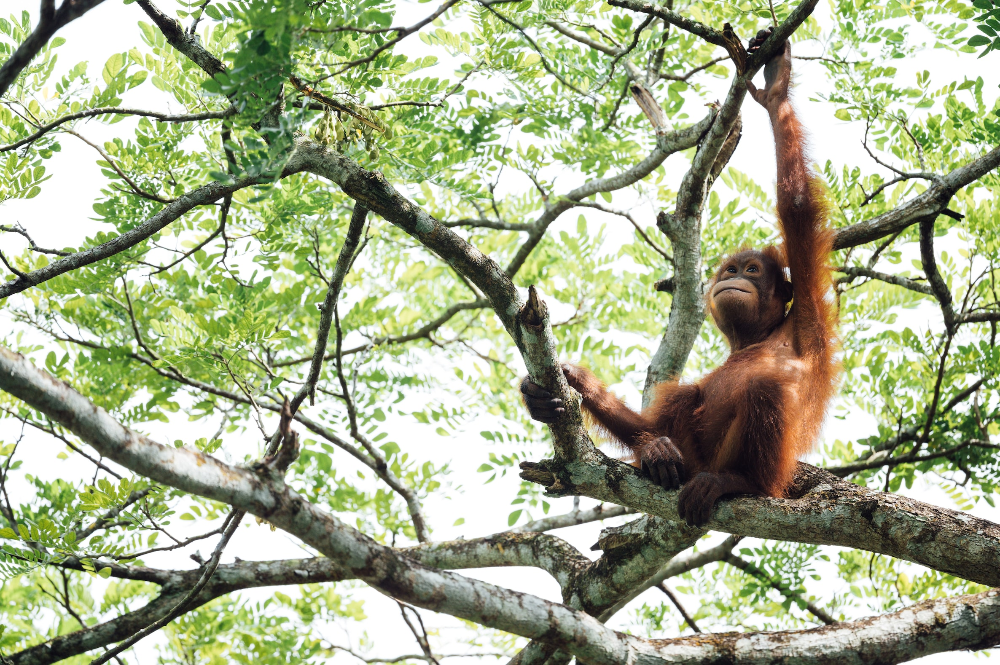

In [ ]:
import requests
from PIL import Image

img_url = 'https://images.unsplash.com/photo-1616128417859-3a984dd35f02?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=2372&q=80'
image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')
image

In [ ]:
inputs = processor(image, return_tensors="pt").to(device)

out = model.generate(**inputs, max_new_tokens=20)
print(processor.decode(out[0],skip_special_tokens=True))

there is a monkey that is sitting in a tree


In [ ]:
desc = (
    "use this tool when given the URL of an image that you'll like to be described"
    "It will return a simple caption describing the image"
)
class ImageCaptionTool(BaseTool):
    name = "Image captioner"
    description = desc

    def _run(self, url: str):
        # download the image and convert to PIL object
        image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')
        # preprocess the image
        inputs = processor(image, return_tensors="pt").to(device)
        # generate the caption
        out = model.generate(**inputs, max_new_tokens=20)
        # get the caption
        caption = processor.decode(out[0], skip_special_tokens=True)
        return caption

    def _arun(self, query: str):
        raise NotImplementedError("This tool does not support async")

tools = [ImageCaptionTool()]

In [ ]:
desc

"use this tool when given the URL of an image that you'll like to be describedIt will return a simple caption describing the image"

In [ ]:
sys_msg = """Assistant is a large language model trained by OpenAI.

Assistant is designed to be able to assist with a wide range of tasks, from answering simple questions to providing in-depth explanations and discussions on a wide range of topics. As a language model, Assistant is able to generate human-like text based on the input it receives, allowing it to engage in natural-sounding conversations and provide responses that are coherent and relevant to the topic at hand.

Assistant is constantly learning and improving, and its capabilities are constantly evolving. It is able to process and understand large amounts of text, and can use this knowledge to provide accurate and informative responses to a wide range of questions. Additionally, Assistant is able to generate its own text based on the input it receives, allowing it to engage in discussions and provide explanations and descriptions on a wide range of topics.

Overall, Assistant is a powerful system that can help with a wide range of tasks and provide valuable insights and information on a wide range of topics. Whether you need help with a specific question or just want to have a conversation about a particular topic, Assistant is here to assist.
"""

new_prompt = agent.agent.create_prompt(
    system_message=sys_msg,
    tools=tools
)

agent.agent.llm_chain.prompt = new_prompt
# update the agent tools
agent.tools = tools

In [ ]:
agent(f"What does this image show?\n{img_url}")



> Entering new AgentExecutor chain...
```json
{
    "action": "Image captioner",
    "action_input": "https://images.unsplash.com/photo-1616128417859-3a984dd35f02?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=2372&q=80"
}
```
Observation: there is a monkey that is sitting in a tree
Thought:```json
{
    "action": "Final Answer",
    "action_input": "The image you provided shows a monkey that is sitting in a tree."
}
```

> Finished chain.


{'input': 'What does this image show?\nhttps://images.unsplash.com/photo-1616128417859-3a984dd35f02?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=2372&q=80',
 'chat_history': [HumanMessage(content='can you calculate the circumference of a circle that has a radius of 7.81mm', additional_kwargs={}, example=False),
  AIMessage(content='The circumference of a circle with a radius of 7.81mm is approximately 49.07mm.', additional_kwargs={}, example=False),
  HumanMessage(content='If I have a triangle with two sides of length 51cm and 34cm, what is the length of the hypotenuse?', additional_kwargs={}, example=False),
  AIMessage(content='The length of the hypotenuse for a triangle with sides of length 51cm and 34cm is approximately 61.29cm.', additional_kwargs={}, example=False)],
 'output': 'The image you provided shows a monkey that is sitting in a tree.'}

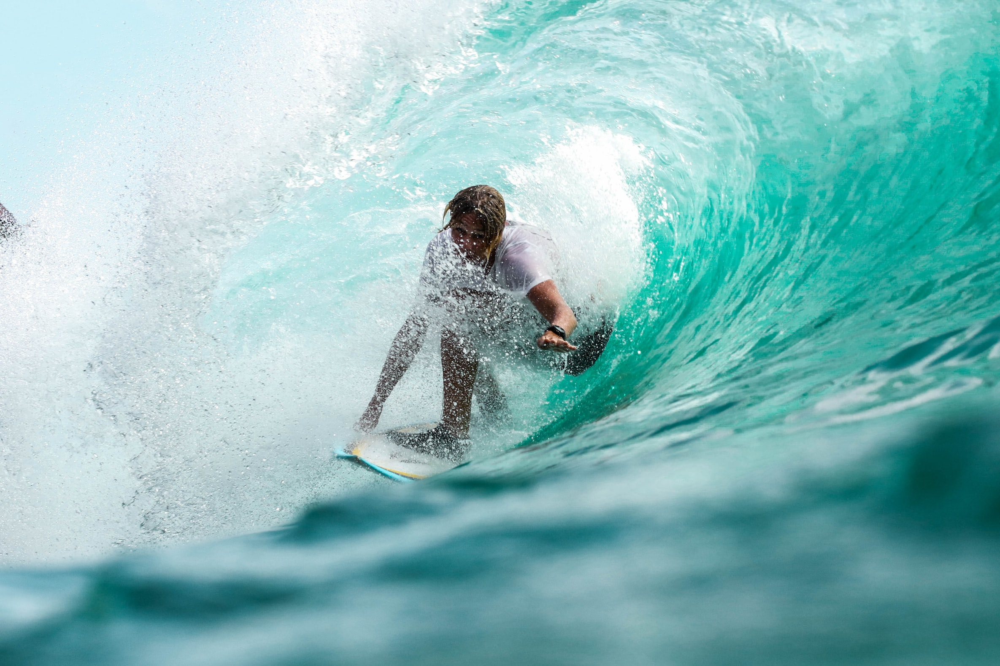

In [ ]:
img_url = "https://images.unsplash.com/photo-1502680390469-be75c86b636f?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=2370&q=80"
image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')
image

In [ ]:
agent(f"What does this image show?\n{img_url}")



> Entering new AgentExecutor chain...
```json
{
    "action": "Image captioner",
    "action_input": "https://images.unsplash.com/photo-1502680390469-be75c86b636f?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=2370&q=80"
}
```
Observation: surfer riding a wave in the ocean on a clear day
Thought:```json
{
    "action": "Final Answer",
    "action_input": "The image shows a surfer riding a wave in the ocean on a clear day."
}
```

> Finished chain.


{'input': 'What does this image show?\nhttps://images.unsplash.com/photo-1502680390469-be75c86b636f?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=2370&q=80',
 'chat_history': [HumanMessage(content='can you calculate the circumference of a circle that has a radius of 7.81mm', additional_kwargs={}, example=False),
  AIMessage(content='The circumference of a circle with a radius of 7.81mm is approximately 49.07mm.', additional_kwargs={}, example=False),
  HumanMessage(content='If I have a triangle with two sides of length 51cm and 34cm, what is the length of the hypotenuse?', additional_kwargs={}, example=False),
  AIMessage(content='The length of the hypotenuse for a triangle with sides of length 51cm and 34cm is approximately 61.29cm.', additional_kwargs={}, example=False),
  HumanMessage(content='What does this image show?\nhttps://images.unsplash.com/photo-1616128417859-3a984dd35f02?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8f

### Tools

#### Pure OpenAI

In [17]:
import openai
import os
openai.api_key = os.environ['OPENAI_API_KEY']

In [18]:
import json
import random

# Example dummy function. In production, this could be your backend API or an external API
def get_current_weather(location, unit="celsius"):
    """Get the current weather in a given location"""
    weather_info = {
        "location": location,
        "temperature": random.randint(15,30),
        "unit": unit,
        "forecast": random.choice(["sunny", "windy", "cloudy", "rainy", "foggy"]),
    }
    return json.dumps(weather_info)

In [20]:
get_current_weather("Istanbul")

'{"location": "Istanbul", "temperature": 24, "unit": "celsius", "forecast": "rainy"}'

First we need to specify meta data about the function

In [21]:
# this is actually a list but we have only one tool atm.
tools = [
    {
        "type": "function",
        "function":
        {
            "name": "get_current_weather",
            "description": "Get the current weather in a given location",
            "parameters": {
                "type": "object",
                "properties": {
                    "location": {
                        "type": "string",
                        "description": "The city",
                    },
                    "unit": {"type": "string", "enum": ["celsius", "fahrenheit"]},
                },
                "required": ["location"],
            }
        }
    }
]

##### Case 1: Auto and input relates tool

In [22]:
messages = [
    {
        "role": "user",
        "content": "What's the weather like in Istanbul"
    }
]

`tool_choice` controls which (if any) tool is called by the model. `none` means the model
will not call a tool and instead generates a message. `auto` means the model
can pick between generating a message or calling a tool. Specifying a
particular tool via `{"type": "function", "function": {"name": "my_tool"}}` forces the model to call that
tool.

`none` is the default when no tools are present. `auto` is the default if
tools are present as in this example.

In [23]:
from openai import OpenAI
client = OpenAI()

response = client.chat.completions.create(
    model="gpt-4o",
    messages=messages,
    tools=tools
).choices[0]

In [24]:
response

Choice(finish_reason='tool_calls', index=0, logprobs=None, message=ChatCompletionMessage(content=None, role='assistant', function_call=None, tool_calls=[ChatCompletionMessageToolCall(id='call_3wSWPbGmhN2glVAvqFfdDcg5', function=Function(arguments='{"location":"Istanbul"}', name='get_current_weather'), type='function')]))

Finish_reason is tool_calls

In [25]:
tc = response.message.tool_calls[0]
tc

ChatCompletionMessageToolCall(id='call_3wSWPbGmhN2glVAvqFfdDcg5', function=Function(arguments='{"location":"Istanbul"}', name='get_current_weather'), type='function')

In [26]:
kwargs = json.loads(tc.function.arguments)
kwargs

{'location': 'Istanbul'}

In [27]:
observation = locals()[tc.function.name](**kwargs)
observation

'{"location": "Istanbul", "temperature": 16, "unit": "celsius", "forecast": "rainy"}'

Injecting the tool call message and its result back to messages and then to LLM to get human like response

In [28]:
messages.append(response.message)
messages

[{'role': 'user', 'content': "What's the weather like in Istanbul"},
 ChatCompletionMessage(content=None, role='assistant', function_call=None, tool_calls=[ChatCompletionMessageToolCall(id='call_3wSWPbGmhN2glVAvqFfdDcg5', function=Function(arguments='{"location":"Istanbul"}', name='get_current_weather'), type='function')])]

In [31]:
messages.append(
    {
        "tool_call_id": tc.id,
        "role": "tool",
        "name": tc.function.name,
        "content": observation,
    }
) 

In [32]:
client.chat.completions.create(
    model="gpt-4o",
    messages=messages
).choices[0]

Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='The current weather in Istanbul is 16°C and rainy.', role='assistant', function_call=None, tool_calls=None))

##### Case 2: Non-related input with auto

In [35]:
messages = [
    {
        "role": "user",
        "content": "Who's Obama?"
    }
]
client.chat.completions.create(
    model="gpt-4o",
    messages=messages,
    tools=tools
).choices[0]

Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Barack Obama is an American politician and attorney who served as the 44th President of the United States from 2009 to 2017. He was the first African American to hold the office. Before his presidency, he represented Illinois in the U.S. Senate from 2005 to 2008 and was an Illinois state senator from 1997 to 2004. Obama is a member of the Democratic Party.\n\nHis presidency is noted for significant legislative achievements and actions, including the passage of the Affordable Care Act (often called "Obamacare"), the Dodd-Frank Wall Street Reform and Consumer Protection Act, and the repeal of the "Don\'t Ask, Don\'t Tell" policy in the military. Internationally, his administration focused on ending U.S. military involvement in Iraq, escalating the military commitment in Afghanistan, and engaging in multilateral diplomacy, including the Paris Agreement on climate change and the Iran nuclear deal.\n

finish_reason is stop. message is a non-tool-calls, content is returned message.

##### Case 3: Tool related input with specific tool

In [37]:
messages = [
    {
        "role": "user",
        "content": "What's wheater like in Istanbul?"
    }
]
client.chat.completions.create(
    model="gpt-4o",
    messages=messages,
    tools=tools,
    tool_choice={"type": "function", "function": {"name": "get_current_weather"}}
).choices[0]

Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content=None, role='assistant', function_call=None, tool_calls=[ChatCompletionMessageToolCall(id='call_kWidls2uA0yBSrdLtuBbgwTI', function=Function(arguments='{"location":"Istanbul"}', name='get_current_weather'), type='function')]))

finish_reason is stop. message is tool-calls.

##### Case 4: Non-related message with specific reference

In [38]:
messages = [
    {
        "role": "user",
        "content": "Who's Barack Obama?"
    }
]
client.chat.completions.create(
    model="gpt-4o",
    messages=messages,
    tools=tools,
    tool_choice={"type": "function", "function": {"name": "get_current_weather"}}
).choices[0]

Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content=None, role='assistant', function_call=None, tool_calls=[ChatCompletionMessageToolCall(id='call_LLmQUlJv0SGTMVzwXVqNS7Jw', function=Function(arguments='{"location":"Kisumu"}', name='get_current_weather'), type='function')]))

finish_reason is stop. message is tool-calls.
LLM tries to its best to adapt the input message to tool call

### Expression Language

Without having to use multiple inputs

In [ ]:
chain = {"name": lambda x: x.split('.')[0], "user_input":lambda x: x.split('.')[1]}|prompt | chat_llm

In [ ]:
chain.invoke("Elvis.What's your name?")

AIMessage(content='My name is Elvis. How can I assist you today?', response_metadata={'token_usage': {'completion_tokens': 12, 'prompt_tokens': 50, 'total_tokens': 62}, 'model_name': 'gpt-3.5-turbo', 'system_fingerprint': 'fp_b28b39ffa8', 'finish_reason': 'stop', 'logprobs': None}, id='run-971e1f6b-2aa7-456f-91f4-ffc3f7fecee2-0')

Adding StrOutputParser to the existing chain

In [ ]:
chain = chain | StrOutputParser()

In [ ]:
chain.invoke("Elvis.What's your name?")

'My name is Elvis. How can I assist you today?'

#### VectorStore

In [ ]:
from operator import itemgetter
from langchain_openai import OpenAIEmbeddings
from langchain.vectorstores import DocArrayInMemorySearch

In [ ]:
fake_docs = [
    "James bond works for MI6",
    "James Bond is a spy",
    "James bond has a license to kill",
    "James bond likes cats"
]
embeddings = OpenAIEmbeddings()
vectorstore = DocArrayInMemorySearch.from_texts(fake_docs, embeddings)
retriever = vectorstore.as_retriever()

In [ ]:
vectorstore.similarity_search("What does Bond like?")

[Document(page_content='James bond likes cats'),
 Document(page_content='James Bond is a spy'),
 Document(page_content='James bond works for MI6'),
 Document(page_content='James bond has a license to kill')]

In [ ]:
# get_relevant_documents is just a wrapper calling vectorstore's similarity_search
retriever.get_relevant_documents("What does Bond like?")

[Document(page_content='James bond likes cats'),
 Document(page_content='James Bond is a spy'),
 Document(page_content='James bond works for MI6'),
 Document(page_content='James bond has a license to kill')]

In [ ]:
# Test
from langchain.chains import RetrievalQA

qa_stuff = RetrievalQA.from_chain_type(
    llm=llm,
    chain_type="stuff",
    retriever=retriever,
    verbose=True
)
query =  "Who is James Bond?"
qa_stuff.invoke("Who is James Bond?")




> Entering new RetrievalQA chain...

> Finished chain.


{'query': 'Who is James Bond?',
 'result': ' James Bond is a spy who works for MI6 and has a license to kill. He also likes cats.'}

In [ ]:
template = """Answer the question based on only the following context:
{context}

Question: {question}
"""
prompt = ChatPromptTemplate.from_template(template)

In [ ]:
output_parser = StrOutputParser()

##### Via RunnableMap

In [ ]:
chain = RunnableMap({
    "context": lambda x: retriever.get_relevant_documents(x["question"]),
    "question": lambda x: x["question"]
}) | prompt | llm | output_parser

In [ ]:
chain.invoke({"question":"where did Bond work?"})

'\nBond worked for MI6.'

How it works?, RunnableMap calls each dictionary entry with the input.

In [ ]:
chain = RunnableMap({
    "context": lambda x: retriever.get_relevant_documents(x["question"]),
    "question": lambda x: x["question"]})

In [ ]:
chain.invoke({"question":"where did Bond work?"})

'\nBond worked for MI6.'

Actually, unless the mapping is single element in the chain, a dictionary is also enough as the expression will be converted to Runnable due to other elements

In [ ]:
chain = {
    "context": lambda x: retriever.get_relevant_documents(x["question"]),
    "question": lambda x: x["question"]
} | prompt | llm | output_parser

In [ ]:
chain.invoke({"question":"where did Bond work?"})

'\nBond worked for MI6.'

##### Shortcut

Following also works because retriever.invoke automatically calls get_relevant_documents

In [ ]:
chain = (
    {"context": retriever,"question": RunnablePassthrough()}|
    prompt|
    llm|
    StrOutputParser()
)

In [ ]:
chain.invoke("Who is James Bond?")

'\nJames Bond is a spy who works for MI6 and has a license to kill. He also likes cats.'

In [ ]:
retriever.invoke("Who is Bond")

[Document(page_content='James Bond is a spy'),
 Document(page_content='James bond works for MI6'),
 Document(page_content='James bond likes cats'),
 Document(page_content='James bond has a license to kill')]

question can be passed as the following as well.

In [ ]:
chain = (
    {"context": retriever,"question": lambda x:x}|
    prompt|
    model|
    StrOutputParser()
)

In [ ]:
chain.invoke("Who is James Bond?")

'James Bond is a spy who works for MI6, has a license to kill, and likes cats.'

Another and more transparent way to call chain

In [ ]:
from operator import itemgetter

In [ ]:
chain = (
    {
      "context": itemgetter("question")|retriever,
      "question": itemgetter("question")
    }|
    prompt|
    llm|
    StrOutputParser()
)

In [ ]:
chain.invoke({"question": "Who is James Bond?"})

'\nJames Bond is a spy who works for MI6 and has a license to kill. He also likes cats.'

Off course the following wont't work

In [ ]:
chain.invoke("Who played james bond first")

TypeError: string indices must be integers

#### Arbitrary Function

In [ ]:
from operator import itemgetter

In [ ]:
def length_func(text):
  return len(text)

In [ ]:
prompt = ChatPromptTemplate.from_template("What is {a}")

chain = {"a":itemgetter("foo") | RunnableLambda(length_func)} | prompt | chat_llm

In [ ]:
chain.invoke({"foo":"akyurek"})

AIMessage(content='7 is a number that comes after 6 and before 8. It is a prime number and is considered lucky in many cultures.', response_metadata={'token_usage': {'completion_tokens': 27, 'prompt_tokens': 11, 'total_tokens': 38}, 'model_name': 'gpt-3.5-turbo', 'system_fingerprint': 'fp_b28b39ffa8', 'finish_reason': 'stop', 'logprobs': None}, id='run-756b9b21-71b3-40f0-aa63-44b8bfb7db75-0')

#### OpenAI Functions

In [ ]:
functions = [
    {
      "name": "joke",
      "description": "A joke",
      "parameters": {
        "type": "object",
        "properties": {
          "setup": {
            "type": "string",
            "description": "The setup for the joke"
          },
        },
        "required": ["setup"]
      }
    }
  ]
functions_chain = prompt | chat_llm.bind(function_call= {"name": "joke"}, functions=functions)
# Here passing function_call= {"name": "joke"} make openai, call this function in any case with best effort

In [ ]:
prompt = ChatPromptTemplate.from_template(
    "tell me 3 interesting facts about {subject}"
    )

In [ ]:
functions_chain.invoke({"subject":"bears"},config={})

AIMessage(content='', additional_kwargs={'function_call': {'arguments': '{"setup":"Why don\'t bears wear shoes?"}', 'name': 'joke'}}, response_metadata={'token_usage': {'completion_tokens': 11, 'prompt_tokens': 65, 'total_tokens': 76}, 'model_name': 'gpt-3.5-turbo', 'system_fingerprint': 'fp_b28b39ffa8', 'finish_reason': 'stop', 'logprobs': None}, id='run-f62fa205-f95c-4e2a-92bf-137ed3fd2915-0')

#### Output Parser

In [ ]:
from langchain.output_parsers.openai_functions import JsonOutputFunctionsParser

functions_chain = (
    prompt |
    chat_llm.bind(function_call={"name":"joke"}, functions=functions) |
    JsonOutputFunctionsParser()
)

In [ ]:
response = functions_chain.invoke({"subject":"bears"})
response

{'setup': "Why don't bears like fast food?"}

In [ ]:
from langchain.output_parsers.openai_functions import JsonKeyOutputFunctionsParser

functions_chain = (
    prompt |
    chat_llm.bind(function_call={"name":"joke"}, functions=functions) |
    JsonKeyOutputFunctionsParser(key_name="setup")
)

In [ ]:
response = functions_chain.invoke({"subject":"bears"})
response

"Why don't bears wear shoes?"

In [ ]:
template = """ turn the following user input into a search query for a search engine:

{input}"""
prompt = ChatPromptTemplate.from_template(template)

In [ ]:
model = ChatOpenAI(temperature=.0)
chain = prompt | model | StrOutputParser() | search

In [ ]:
chain.invoke({"input":"Who played james bond first"})

'As of 2020, there have been seven actors who have played the iconic role of James Bond: Sean Connery, David Niven, George Lazenby, Roger Moore, Timothy Dalton, Pierce Brosnan and Daniel Craig. Connery is the actor who has played Bond the most times, with a total of six films under his belt. This includes the first ever Bond film, "Dr. Sir Roger George Moore KBE (14 October 1927 - 23 May 2017) was an English actor. He was the third actor to portray fictional secret agent James Bond in the Eon Productions/MGM Studios film series, playing the character in seven feature films between 1973 and 1985. Moore\'s seven appearances as Bond, from Live and Let Die to A View to a Kill, are the most of any actor in the Eon-produced entries.'

There's another way to call the chain

In [ ]:
chain = (
    {"input": RunnablePassthrough()}|
    prompt|
    model|
    StrOutputParser() |
    search
)

#### Advanced Chain Inputs

In [ ]:
template = """Answer the question based on only the following context:
{context}

Question: {question}

Answer in the following language: {language}
"""
prompt = ChatPromptTemplate.from_template(template)

In [ ]:
chain = (
    {
      "context": itemgetter("question")|retriever,
      "question": itemgetter("question"),
      "language": itemgetter("language")
    }|
    prompt|
    model|
    StrOutputParser()
)

In [ ]:
chain.invoke({"question": "Who is James Bond?","language": "turkish"})

'James Bond, bir casustur.'

### LangGraph

In [79]:
from langgraph.graph import Graph, END

In [80]:
def function_1(input_1):
    return input_1 + " Hi "

def function_2(input_2):
    return input_2 + "there"

In [81]:
# Define a Langchain graph
graph = Graph()

graph.add_node("node_1", function_1)
graph.add_node("node_2", function_2)

graph.add_edge('node_1', 'node_2')

graph.set_entry_point("node_1")
graph.set_finish_point("node_2")
# or graph.add_edge('node_2', END)

cg = graph.compile()

In [82]:
cg.invoke("Hello")

'Hello Hi there'

In [83]:
# node by node processing
input = 'Hello'
for output in cg.stream(input):
    # stream() yields dictionaries with output keyed by node name
    for key, value in output.items():
        print(f"Output from '{key}':{value}")

Output from 'node_1':Hello Hi 
Output from 'node_2':Hello Hi there


In [84]:
# btw END is just a special node with string __end__
print(END)

__end__


#### Decisions

In [85]:
from typing import Dict, TypedDict, Optional
class State(TypedDict):
  question: Optional[str] = None
  classification: Optional[str] = None
  response: Optional[str] = None

In [86]:
def handle_greeting_node(state):
    return {"response": "Hello! How can I help you today?"}

def handle_search_node(state):
    question = state.get('question', '').strip()
    search_result = f"Search result for '{question}'"
    return {"response": search_result}

def classify_input_node(state):
    question = state.get('question', '').strip()
    if "hello" in question.lower():
      classification = "greeting"
    else:
      classification = "handle_search"
    return {"classification": classification}

def decide_next_node(state):
    return "handle_greeting" if state.get('classification') == "greeting" else "handle_search"

In [87]:
from langgraph.graph import StateGraph,  END
graph = StateGraph(State)

In [88]:
graph.add_node("classify_input", classify_input_node)
graph.add_node("handle_greeting", handle_greeting_node)
graph.add_node("handle_search", handle_search_node)

graph.add_conditional_edges(
    "classify_input",
    decide_next_node,
    {
        "handle_greeting": "handle_greeting",
        "handle_search": "handle_search"
    }
)
# when there are multiple ends, they are set as below
graph.set_entry_point("classify_input")
graph.add_edge('handle_greeting', END)
graph.add_edge('handle_search', END)

In [89]:
cg = graph.compile()
state = {"question": "Hello, how are you?"}
result = cg.invoke(state)
print(result)

{'question': 'Hello, how are you?', 'classification': 'greeting', 'response': 'Hello! How can I help you today?'}


#### Adding LLM

In [90]:
from langchain_openai import ChatOpenAI

# Set the model as ChatOpenAI
chat_llm = ChatOpenAI(temperature=0)

In [91]:
from langchain.schema.output_parser import StrOutputParser

In [92]:
def function_1(input_1):
    response = chat_llm.invoke(input_1)
    return response.content
def function_2(input_2):
    s = "Agent Says: " + str(input_2)
    return s

In [93]:
graph = Graph()

# calling node 1 as agent
# There are two alternatives. I can use implemented function_1, but I use chaining syntax to get
# string output from chat_llm
#function_1 = chat_llm | StrOutputParser()
graph.add_node("agent", function_1)
graph.add_node("node_2", function_2)

graph.add_edge('agent', 'node_2')

graph.set_entry_point("agent")
graph.set_finish_point("node_2")

cg = graph.compile()

In [94]:
cg.invoke("Hey there")

'Agent Says: Hello! How can I assist you today?'

#### Streaming

In [95]:
for output in cg.stream("Hey there"):
    print("*********")
    for key, value in output.items():
        print("---")
        print(f"Output from node '{key}':")
        print(value)
        print("---")

*********
---
Output from node 'agent':
Hello! How can I assist you today?
---
*********
---
Output from node 'node_2':
Agent Says: Hello! How can I assist you today?
---


#### Adding Tools

In [96]:
from typing import Annotated, List, TypedDict

from langchain_core.messages import AIMessage, BaseMessage, HumanMessage, ToolMessage
from langchain_core.runnables import RunnableLambda
from langgraph.graph import END, StateGraph, add_messages

In [125]:
from langchain_core.tools import tool

@tool
def multiply(x: float, y: float) -> float:
    """Multiply 'x' times 'y'."""
    return x * y


@tool
def exponentiate(x: float, y: float) -> float:
    """Raise 'x' to the 'y'."""
    return x**y


@tool
def add(x: float, y: float) -> float:
    """Add 'x' and 'y'."""
    return x + y

tools = [multiply, exponentiate, add]
chat_llm_with_tools = ChatOpenAI(temperature=0).bind_tools(tools)

In [98]:
# Test tool suggestion
resp = chat_llm_with_tools.invoke("What is 2 times 3?")
resp

AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_tNN3UMzXqvfx1smDHgg2lB0W', 'function': {'arguments': '{"x":2,"y":3}', 'name': 'multiply'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 17, 'prompt_tokens': 111, 'total_tokens': 128}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-db7b9436-ca95-4dc2-9ce8-23d650815fee-0', tool_calls=[{'name': 'multiply', 'args': {'x': 2, 'y': 3}, 'id': 'call_tNN3UMzXqvfx1smDHgg2lB0W'}], usage_metadata={'input_tokens': 111, 'output_tokens': 17, 'total_tokens': 128})

In [27]:
def call_model(state):
    return {"messages": chat_llm_with_tools.invoke(state["messages"])}

In [28]:
class AgentState(TypedDict):
    messages: Annotated[list, add_messages]

In [29]:
graph = StateGraph(AgentState)
graph.add_node("agent", call_model)
graph.add_edge("agent", END)
graph.set_entry_point("agent")
cg = graph.compile()

In [30]:
result=cg.invoke({"messages": ("human","what's 3 plus 6")})
result

{'messages': [HumanMessage(content="what's 3 plus 6", id='e4f4cfa2-bd78-46e7-86ab-76335f7e9cce'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_NquKeBlq0jM3tRuX2vmXdqHI', 'function': {'arguments': '{"x":3,"y":6}', 'name': 'add'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 17, 'prompt_tokens': 110, 'total_tokens': 127}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-6a4dc65d-5f00-499f-8c1f-cca1e44cb9b7-0', tool_calls=[{'name': 'add', 'args': {'x': 3, 'y': 6}, 'id': 'call_NquKeBlq0jM3tRuX2vmXdqHI'}], usage_metadata={'input_tokens': 110, 'output_tokens': 17, 'total_tokens': 127})]}

In [31]:
# pretty print AIMessage containing tool call
from pprint import pprint
pprint(result["messages"][-1].__dict__)


{'additional_kwargs': {'tool_calls': [{'function': {'arguments': '{"x":3,"y":6}',
                                                    'name': 'add'},
                                       'id': 'call_NquKeBlq0jM3tRuX2vmXdqHI',
                                       'type': 'function'}]},
 'content': '',
 'example': False,
 'id': 'run-6a4dc65d-5f00-499f-8c1f-cca1e44cb9b7-0',
 'invalid_tool_calls': [],
 'name': None,
 'response_metadata': {'finish_reason': 'tool_calls',
                       'logprobs': None,
                       'model_name': 'gpt-3.5-turbo-0125',
                       'system_fingerprint': None,
                       'token_usage': {'completion_tokens': 17,
                                       'prompt_tokens': 110,
                                       'total_tokens': 127}},
 'tool_calls': [{'args': {'x': 3, 'y': 6},
                 'id': 'call_NquKeBlq0jM3tRuX2vmXdqHI',
                 'name': 'add'}],
 'type': 'ai',
 'usage_metadata': {'input_tokens': 110,

#### Adding ToolCall message (w/o call)

In [32]:
def call_tool(state):
    last_message = state["messages"][-1]
    tool_call = last_message.tool_calls[0]
    return {"messages": ToolMessage(content="test_tool_result", name=tool_call["name"], tool_call_id=tool_call["id"])}

In [33]:
graph = StateGraph(AgentState)
graph.add_node("agent", call_model)
graph.add_node("tool", call_tool)
graph.add_edge("agent", "tool")
graph.add_edge("tool", END)
graph.set_entry_point("agent")
cg = graph.compile()

In [34]:
cg.invoke({"messages": ("human","what's 3 plus 6")})

{'messages': [HumanMessage(content="what's 3 plus 6", id='16e4e01a-f299-456e-bf1b-fe3b47fd1954'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_O7Ot0SUqqFOi0UvrpcDXMrXZ', 'function': {'arguments': '{"x":3,"y":6}', 'name': 'add'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 17, 'prompt_tokens': 110, 'total_tokens': 127}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-099c437e-b5da-48e3-a1b8-bee9ba27825c-0', tool_calls=[{'name': 'add', 'args': {'x': 3, 'y': 6}, 'id': 'call_O7Ot0SUqqFOi0UvrpcDXMrXZ'}], usage_metadata={'input_tokens': 110, 'output_tokens': 17, 'total_tokens': 127}),
  ToolMessage(content='test_tool_result', name='add', id='68af5336-250c-40f9-a0e6-dae0e3f0f7ed', tool_call_id='call_O7Ot0SUqqFOi0UvrpcDXMrXZ')]}

#### Calling Tools

##### Manually

Here we find the tool and invoke it manually

In [35]:
def call_tool_v1(state):
    last_message = state["messages"][-1]
    tool_call = last_message.tool_calls[0]
    lc_tool = {tool.name: tool for tool in tools}[tool_call['name']]
    return {"messages": ToolMessage(content=lc_tool.invoke(tool_call['args']), name=tool_call["name"], tool_call_id=tool_call["id"])}

In [36]:
graph = StateGraph(AgentState)
graph.add_node("agent", call_model)
graph.add_node("tool", call_tool_v1)
graph.add_edge("agent", "tool")
graph.add_edge("tool", END)
graph.set_entry_point("agent")
cg = graph.compile()

In [37]:
cg.invoke({"messages": ("human","what's 3 plus 6")})

{'messages': [HumanMessage(content="what's 3 plus 6", id='033dac3d-b15e-4fd2-84dd-4e7ff9a56e26'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_3Wrag4MDQd2u0I9sy8QOd3ex', 'function': {'arguments': '{"x":3,"y":6}', 'name': 'add'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 17, 'prompt_tokens': 110, 'total_tokens': 127}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-4a6901fa-fac6-4531-97d9-af36b6308a62-0', tool_calls=[{'name': 'add', 'args': {'x': 3, 'y': 6}, 'id': 'call_3Wrag4MDQd2u0I9sy8QOd3ex'}], usage_metadata={'input_tokens': 110, 'output_tokens': 17, 'total_tokens': 127}),
  ToolMessage(content='9.0', name='add', id='3adbbdff-4f28-4989-a95e-f933cbfcea7b', tool_call_id='call_3Wrag4MDQd2u0I9sy8QOd3ex')]}

##### ToolExecutor

Here we use ToolExecutor,ToolInvocation to find and invoke the tool

In [38]:
from langgraph.prebuilt import ToolExecutor,ToolInvocation
tool_executor = ToolExecutor(tools)

In [39]:
# Test tool executor
action = ToolInvocation(
        tool='multiply',
        tool_input={'x':3.0, 'y':4.0},
)
action

ToolInvocation(tool='multiply', tool_input={'x': 3.0, 'y': 4.0})

In [40]:
tool_executor.invoke(action)

12.0

In [41]:
def call_tool_v2(state):
    last_message = state["messages"][-1]

    tool_call = last_message.tool_calls[0]
    action = ToolInvocation(
        tool=tool_call["name"],
        tool_input=tool_call["args"],
    )
    return {"messages": ToolMessage(content=tool_executor.invoke(action), name=action.tool, tool_call_id=tool_call["id"])}

In [42]:
graph = StateGraph(AgentState)
graph.add_node("agent", call_model)
graph.add_node("tool", call_tool_v2)
graph.add_edge("agent", "tool")
graph.add_edge("tool", END)
graph.set_entry_point("agent")
cg = graph.compile()

In [43]:
cg.invoke({"messages": ("human","what's 3 plus 6")})

{'messages': [HumanMessage(content="what's 3 plus 6", id='b6753c79-94ac-40d4-933b-a6cfcea933e9'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_ewpoKIVNkraxgMSpC0sMwfb1', 'function': {'arguments': '{"x":3,"y":6}', 'name': 'add'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 17, 'prompt_tokens': 110, 'total_tokens': 127}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-04cfe5e8-faab-4f8e-ad0c-a9e3b57ad60c-0', tool_calls=[{'name': 'add', 'args': {'x': 3, 'y': 6}, 'id': 'call_ewpoKIVNkraxgMSpC0sMwfb1'}], usage_metadata={'input_tokens': 110, 'output_tokens': 17, 'total_tokens': 127}),
  ToolMessage(content='9.0', name='add', id='e8135225-f314-4ab4-b213-244f7ef9f107', tool_call_id='call_ewpoKIVNkraxgMSpC0sMwfb1')]}

##### ToolNode

In [126]:
from langgraph.prebuilt import ToolNode

tool_node = ToolNode(tools)

In [127]:
tool_node

tools(recurse=True, tools_by_name={'multiply': StructuredTool(name='multiply', description="Multiply 'x' times 'y'.", args_schema=<class 'pydantic.v1.main.multiplySchema'>, func=<function multiply at 0x00000204C9A75800>), 'exponentiate': StructuredTool(name='exponentiate', description="Raise 'x' to the 'y'.", args_schema=<class 'pydantic.v1.main.exponentiateSchema'>, func=<function exponentiate at 0x00000204C9A753A0>), 'add': StructuredTool(name='add', description="Add 'x' and 'y'.", args_schema=<class 'pydantic.v1.main.addSchema'>, func=<function add at 0x00000204C9A74040>)})

In [128]:
graph = StateGraph(AgentState)
graph.add_node("agent", call_model)
graph.add_node("tool", tool_node)
graph.add_edge("agent", "tool")
graph.add_edge("tool", END)
graph.set_entry_point("agent")
cg = graph.compile()

In [129]:
cg.invoke({"messages": ("human","what's 3 plus 6")})

{'messages': [HumanMessage(content="what's 3 plus 6", id='fa65cac4-2405-40d7-b00c-3b38a73d6b9c'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_YS9StmbNXRveod6ViNY2Mwdk', 'function': {'arguments': '{"x":3,"y":6}', 'name': 'add'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 17, 'prompt_tokens': 110, 'total_tokens': 127}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-740f2b3d-9898-4e46-b73d-07692084d9d6-0', tool_calls=[{'name': 'add', 'args': {'x': 3, 'y': 6}, 'id': 'call_YS9StmbNXRveod6ViNY2Mwdk'}], usage_metadata={'input_tokens': 110, 'output_tokens': 17, 'total_tokens': 127}),
  ToolMessage(content='9.0', name='add', id='e4aa7a33-2a08-40e4-887e-9138f8cf33e0', tool_call_id='call_YS9StmbNXRveod6ViNY2Mwdk')]}

#### Feeding Tool Result

Here we again call model to interpret the tool result and return a meaningful text, regarding the input and tool call result.

In [44]:
graph = StateGraph(AgentState)
graph.add_node("agent", call_model)
graph.add_node("tool", call_tool_v2)
graph.add_node("finalize", call_model)

graph.add_edge("agent", "tool")
graph.add_edge("tool", "finalize")
graph.add_edge("finalize", END)

graph.set_entry_point("agent")
cg = graph.compile()

In [45]:
cg.invoke({"messages": ("human","what's 3 plus 6")})

{'messages': [HumanMessage(content="what's 3 plus 6", id='c5a60f4e-aa80-4cc3-8886-2de375da0137'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_xnjKRvoBGX6AsVRqUlIZqKYD', 'function': {'arguments': '{"x":3,"y":6}', 'name': 'add'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 17, 'prompt_tokens': 110, 'total_tokens': 127}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-87d8b49e-c38b-487d-9892-1655d5d53ed4-0', tool_calls=[{'name': 'add', 'args': {'x': 3, 'y': 6}, 'id': 'call_xnjKRvoBGX6AsVRqUlIZqKYD'}], usage_metadata={'input_tokens': 110, 'output_tokens': 17, 'total_tokens': 127}),
  ToolMessage(content='9.0', name='add', id='ec121e2b-476f-433b-af91-fac259dcca15', tool_call_id='call_xnjKRvoBGX6AsVRqUlIZqKYD'),
  AIMessage(content='3 plus 6 is equal to 9.', response_metadata={'token_usage': {'completion_tokens': 11, 'prompt_tokens': 137, 'total_tokens': 148

#### Adding Condition and Cycle

In [46]:
def visit_tool(state):
    return "yes" if state["messages"][-1].tool_calls else "no"

In [47]:
graph = StateGraph(AgentState)
graph.add_node("agent", call_model)
graph.add_node("tool", call_tool_v2)
graph.add_conditional_edges(
    "agent",
    visit_tool,
    {
        "yes": "tool",
        "no": END,
    },
)
graph.add_edge("tool", "agent")
graph.set_entry_point("agent")
cg = graph.compile()

In [48]:
cg.invoke({"messages": ("human","what's 3 plus 6")})

{'messages': [HumanMessage(content="what's 3 plus 6", id='4a35644f-9f28-4196-a66f-bb77c7358c71'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_1YaFXZFe5b1StPHuDWpXGsiD', 'function': {'arguments': '{"x":3,"y":6}', 'name': 'add'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 17, 'prompt_tokens': 110, 'total_tokens': 127}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-513650bf-b489-49e9-b344-76d1a4fa1db9-0', tool_calls=[{'name': 'add', 'args': {'x': 3, 'y': 6}, 'id': 'call_1YaFXZFe5b1StPHuDWpXGsiD'}], usage_metadata={'input_tokens': 110, 'output_tokens': 17, 'total_tokens': 127}),
  ToolMessage(content='9.0', name='add', id='8a3aacf8-a75e-4c7a-a261-a60505e486c6', tool_call_id='call_1YaFXZFe5b1StPHuDWpXGsiD'),
  AIMessage(content='3 plus 6 is equal to 9.', response_metadata={'token_usage': {'completion_tokens': 11, 'prompt_tokens': 137, 'total_tokens': 148

In [49]:
cg.invoke({"messages": ("human","who's Elon Musk")})

{'messages': [HumanMessage(content="who's Elon Musk", id='e75afae3-b5b1-40f7-8698-c866fec555b4'),
  AIMessage(content='Elon Musk is a well-known entrepreneur and business magnate. He is the founder, CEO, and lead designer of SpaceX; early investor, CEO, and product architect of Tesla, Inc.; founder of The Boring Company; co-founder of Neuralink; and co-founder and initial co-chairman of OpenAI. Musk is known for his ambitious vision for the future, including the colonization of Mars and the development of sustainable energy solutions.', response_metadata={'token_usage': {'completion_tokens': 89, 'prompt_tokens': 107, 'total_tokens': 196}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'stop', 'logprobs': None}, id='run-32174418-f331-4a2d-8062-ac02c2235a0a-0', usage_metadata={'input_tokens': 107, 'output_tokens': 89, 'total_tokens': 196})]}

#### Making it useful

##### A research assistant

In [135]:
from langgraph.graph import StateGraph, END
from typing import TypedDict, Annotated
from langgraph.prebuilt import ToolExecutor,ToolInvocation
from langchain_core.messages import AnyMessage, SystemMessage, HumanMessage, ToolMessage
from langchain_openai import ChatOpenAI
from langchain_community.tools.tavily_search import TavilySearchResults

In [136]:
tool = TavilySearchResults(max_results=4) #increased number of results
print(type(tool))
print(tool.name)

<class 'langchain_community.tools.tavily_search.tool.TavilySearchResults'>
tavily_search_results_json


In [103]:
# tool test
tool.invoke("Who is Obama")

[{'url': 'https://www.britannica.com/biography/Barack-Obama',
  'content': 'After working as a writer and editor in Manhattan, Barack Obama became a community organizer in Chicago, lectured on constitutional law at the University of Chicago, worked as a civil rights attorney, and then served in the Illinois Senate (1997–2004), as a U.S. senator (2005–08), and as U.S. president (2009–17).\n He returned to Hawaii in 1971 and lived in a modest apartment, sometimes with his grandparents and sometimes with his\nmother (she remained for a time in Indonesia, returned to Hawaii, and then went abroad again—partly to pursue work on a Ph.D.—before divorcing Soetoro in 1980). Early life\nObama’s father, Barack Obama, Sr., was a teenage goatherd in rural Kenya, won a scholarship to study in the United States, and eventually became a senior economist in the Kenyan government. After serving for a couple of years as a writer and editor for Business International Corp., a research, publishing, and cons

In [137]:
class AgentState(TypedDict):
    initialized: bool # if we do not initialized, here agent still works but it doesn't show initialized in the invoke return value
    messages: Annotated[list, add_messages]

In [266]:
class Agent:

    def __init__(self, model, tools, system="", state_cls=AgentState, checkpointer=None, interrupt_before=None):
        self.system = system
        graph = StateGraph(state_cls)
        graph.add_node("initialize", self.initialize)
        graph.add_node("llm", self.call_openai)
        graph.add_node("action", self.take_action)
        graph.add_conditional_edges(
            "llm",
            self.exists_action,
            {True: "action", False: END}
        )
        graph.add_edge("initialize", "llm")
        graph.add_edge("action", "llm")
        graph.set_entry_point("initialize")
        self.graph = graph.compile(
            checkpointer=checkpointer,# these param used later in memory section
            interrupt_before=interrupt_before # these param used later in break&continue section
            )
        self.tool_executor = ToolExecutor(tools)        
        self.model = model.bind_tools(tools)

    def initialize(self, state: AgentState):
        if not state.get("initialized"):
            state['messages'].insert(0, SystemMessage(content=self.system))
        return {"initialized":True}
    
    def exists_action(self, state: AgentState):
        result = state['messages'][-1]
        return len(result.tool_calls) > 0

    def call_openai(self, state: AgentState):
        messages = state['messages']
        message = self.model.invoke(messages)
        return {'messages': [message]}

    def take_action(self, state: AgentState):
        tool_calls = state['messages'][-1].tool_calls
        results = []
        for t in tool_calls:
            action = ToolInvocation(
                tool=t["name"],
                tool_input=t["args"],
            )
            tool_result = self.tool_executor.invoke(action)
            results.append(ToolMessage(content=str(tool_result), name=action.tool, tool_call_id=t["id"]))
        return {'messages': results}

In [121]:
prompt = """You are a smart research assistant. Use the search engine to look up information. \
You are allowed to make multiple calls (either together or in sequence). \
Only look up information when you are sure of what you want. \
If you need to look up some information before asking a follow up question, you are allowed to do that!
"""

model = ChatOpenAI(model="gpt-3.5-turbo")  #reduce inference cost
agent = Agent(model, [tool], system=prompt)

In [107]:
agent.graph.invoke({"messages": "What is the weather in sf?"})

{'initialized': True,
 'messages': [SystemMessage(content='You are a smart research assistant. Use the search engine to look up information. You are allowed to make multiple calls (either together or in sequence). Only look up information when you are sure of what you want. If you need to look up some information before asking a follow up question, you are allowed to do that!\n', id='a4b90ecd-d7ad-42b1-9659-55ed854a0703'),
  HumanMessage(content='What is the weather in sf?', id='1f4bb28b-8391-4fa3-a649-85965b511d06'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_ZxS9UQUDJRJ5lqBQwAV2Vjns', 'function': {'arguments': '{"query":"weather in San Francisco"}', 'name': 'tavily_search_results_json'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 21, 'prompt_tokens': 153, 'total_tokens': 174}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-88766ce1-6f43-4cb7-a761-

In [108]:
# with streaming
for output in agent.graph.stream({"messages": "What is the weather in sf?"}):
    print("*********")
    for key, value in output.items():
        print("---")
        print(f"Output from node '{key}':")
        print(value)
        print("---")

*********
---
Output from node 'initialize':
{'initialized': True}
---
*********
---
Output from node 'llm':
{'messages': [AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_HEqXJS70f1lbcDJcOWGo50Vg', 'function': {'arguments': '{"query":"weather in San Francisco"}', 'name': 'tavily_search_results_json'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 21, 'prompt_tokens': 153, 'total_tokens': 174}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-ccf12888-c1a3-4d85-a7bd-3454696faed0-0', tool_calls=[{'name': 'tavily_search_results_json', 'args': {'query': 'weather in San Francisco'}, 'id': 'call_HEqXJS70f1lbcDJcOWGo50Vg'}], usage_metadata={'input_tokens': 153, 'output_tokens': 21, 'total_tokens': 174})]}
---
*********
---
Output from node 'action':
{'messages': [ToolMessage(content='[{\'url\': \'https://www.accuweather.com/en/us/san-francisco/94103/june-weather/34762

##### Adding memory

In the previous example, when we call agent.graph.invoke, it'll start with empty state.

In [109]:
from langgraph.checkpoint.sqlite import SqliteSaver

memory = SqliteSaver.from_conn_string(":memory:")

agent = Agent(model, [tool], system=prompt, checkpointer=memory)

In [110]:
config = {"configurable": {"thread_id": "1"}}
agent.graph.invoke({"messages": "What is the wheather in Istanbul"}, config)

{'initialized': True,
 'messages': [SystemMessage(content='You are a smart research assistant. Use the search engine to look up information. You are allowed to make multiple calls (either together or in sequence). Only look up information when you are sure of what you want. If you need to look up some information before asking a follow up question, you are allowed to do that!\n', id='48bc9528-f624-4185-bfab-eb0b0b9686bb'),
  HumanMessage(content='What is the wheather in Istanbul', id='846e51d8-bf02-4941-bd18-bc369b065ff4'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_AGZ5d7BfkkMMLcYHulU6zooj', 'function': {'arguments': '{"query":"weather in Istanbul"}', 'name': 'tavily_search_results_json'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 20, 'prompt_tokens': 153, 'total_tokens': 173}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-3e1fefb3-a6d0-452e-9b74

In [51]:
agent.graph.invoke({"messages": "What about Izmir"}, config)

Calling: {'name': 'tavily_search_results_json', 'args': {'query': 'weather in Izmir'}, 'id': 'call_9BeWz8Q6IfHvhHYmjJTU11ks'}
Back to the model!


{'messages': [SystemMessage(content='You are a smart research assistant. Use the search engine to look up information. You are allowed to make multiple calls (either together or in sequence). Only look up information when you are sure of what you want. If you need to look up some information before asking a follow up question, you are allowed to do that!\n', id='35128c60-d9c9-4e39-8df5-157112d054e6'),
  SystemMessage(content='You are a smart research assistant. Use the search engine to look up information. You are allowed to make multiple calls (either together or in sequence). Only look up information when you are sure of what you want. If you need to look up some information before asking a follow up question, you are allowed to do that!\n', id='3f9b0fc8-3a0d-40dd-86f1-066b35e32842'),
  HumanMessage(content='What is the wheather in Istanbul', id='fe2b44fd-ddd0-4258-b1f4-8de82b242805'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'function': {'arguments': '{"query":"wea

##### Streaming

In [62]:
# node streaming
for event in agent.graph.stream({"messages": "How is the wheather in LA"}, config):
    for v in event.values():
        m=v.get('messages')
        if(m and m[0].content):
            if type(m[0])==AIMessage:
                print(m[0].content)

The current weather in Los Angeles is 73.0°F with sunny skies. The wind speed is 15.1 km/h coming from the west. The humidity is at 61%.


Token streaming

In [123]:
from langgraph.checkpoint.aiosqlite import AsyncSqliteSaver
model = ChatOpenAI(model="gpt-3.5-turbo-1106", streaming=True)
memory = AsyncSqliteSaver.from_conn_string(":memory:")
agent = Agent(model, [tool], system=prompt, checkpointer=memory)

In [124]:
# token streaming
config = {"configurable": {"thread_id": "1"}}
async for e in agent.graph.astream_events({"messages": "How is the wheather in LA"}, config, version="v1"):
    if e["event"] == "on_chat_model_stream":
        print(e['data']['chunk'].content,end="")

The current weather in Los Angeles is sunny with a temperature of 73.9°F. The wind is blowing from the north at 11.2 kph, and the humidity is at 57%.

##### Break&Continue

In [223]:
from langgraph.checkpoint import MemorySaver

In [202]:
prompt = """You are a smart research assistant. Use the search engine to look up information. \
You are allowed to make multiple calls (either together or in sequence). \
Only look up information when you are sure of what you want. \
If you need to look up some information before asking a follow up question, you are allowed to do that!
"""

model = ChatOpenAI(model="gpt-3.5-turbo")  #reduce inference cost
memory = MemorySaver()
agent = Agent(model, [tool], system=prompt, checkpointer=memory, interrupt_before=["action"])

In [203]:
config = {"configurable": {"thread_id": "1"}}

In [207]:
agent.graph.get_state(config)

StateSnapshot(values={'messages': []}, next=(), config={'configurable': {'thread_id': '1'}}, metadata=None, created_at=None, parent_config=None)

In [195]:
agent.graph.invoke({"messages": "What is the weather in sf?"},config)

{'initialized': True,
 'messages': [SystemMessage(content='You are a smart research assistant. Use the search engine to look up information. You are allowed to make multiple calls (either together or in sequence). Only look up information when you are sure of what you want. If you need to look up some information before asking a follow up question, you are allowed to do that!\n', id='1432777d-5963-41fd-8245-10a818e25edf'),
  HumanMessage(content='What is the weather in sf?', id='49482faa-8f74-4509-b124-451bd2bcf91b'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_x1dZkC8CzbExcXSdDLf6dmmW', 'function': {'arguments': '{"query":"weather in San Francisco"}', 'name': 'tavily_search_results_json'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 21, 'prompt_tokens': 153, 'total_tokens': 174}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-1fc215ef-0095-4213-b4c8-

In [196]:
ss = agent.graph.get_state(config)

In [211]:
ss.config

{'configurable': {'thread_id': '1',
  'thread_ts': '1ef37874-9282-6aa7-8002-0c3e18abafd6'}}

In [197]:
ss.values

{'initialized': True,
 'messages': [SystemMessage(content='You are a smart research assistant. Use the search engine to look up information. You are allowed to make multiple calls (either together or in sequence). Only look up information when you are sure of what you want. If you need to look up some information before asking a follow up question, you are allowed to do that!\n', id='1432777d-5963-41fd-8245-10a818e25edf'),
  HumanMessage(content='What is the weather in sf?', id='49482faa-8f74-4509-b124-451bd2bcf91b'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_x1dZkC8CzbExcXSdDLf6dmmW', 'function': {'arguments': '{"query":"weather in San Francisco"}', 'name': 'tavily_search_results_json'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 21, 'prompt_tokens': 153, 'total_tokens': 174}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-1fc215ef-0095-4213-b4c8-

In [198]:
ss.next

('action',)

In [199]:
# resume
agent.graph.invoke(None,config)

{'initialized': True,
 'messages': [SystemMessage(content='You are a smart research assistant. Use the search engine to look up information. You are allowed to make multiple calls (either together or in sequence). Only look up information when you are sure of what you want. If you need to look up some information before asking a follow up question, you are allowed to do that!\n', id='1432777d-5963-41fd-8245-10a818e25edf'),
  HumanMessage(content='What is the weather in sf?', id='49482faa-8f74-4509-b124-451bd2bcf91b'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_x1dZkC8CzbExcXSdDLf6dmmW', 'function': {'arguments': '{"query":"weather in San Francisco"}', 'name': 'tavily_search_results_json'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 21, 'prompt_tokens': 153, 'total_tokens': 174}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-1fc215ef-0095-4213-b4c8-

In [200]:
agent.graph.get_state(config).next

()

##### History

In [305]:
memory = MemorySaver()

In [306]:
agent = Agent(model, [tool], system=prompt, checkpointer=memory)

In [307]:
config = {"configurable": {"thread_id": "1"}}
agent.graph.invoke({"messages": "What is the weather in sf?"}, config)

{'initialized': True,
 'messages': [SystemMessage(content='You are a smart research assistant. Use the search engine to look up information. You are allowed to make multiple calls (either together or in sequence). Only look up information when you are sure of what you want. If you need to look up some information before asking a follow up question, you are allowed to do that!\n', id='2e030f75-27b6-4a91-bdaa-baf6ac4fad00'),
  HumanMessage(content='What is the weather in sf?', id='34e162c2-fded-479b-868a-7661ae9105b9'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_yK6Mg8a9W38wDpTGStU2LWeL', 'function': {'arguments': '{"query":"weather in San Francisco"}', 'name': 'tavily_search_results_json'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 21, 'prompt_tokens': 153, 'total_tokens': 174}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-ab5ac482-90f3-4830-b791-

In [308]:
*states, = agent.graph.get_state_history(config)
states

[StateSnapshot(values={'messages': []}, next=('__start__',), config={'configurable': {'thread_id': '1', 'thread_ts': '1ef37b15-a296-637d-bfff-7219ee6382eb'}}, metadata={'source': 'input', 'step': -1, 'writes': {'messages': 'What is the weather in sf?'}}, created_at='2024-07-01T13:53:53.317567+00:00', parent_config=None),
 StateSnapshot(values={'messages': [HumanMessage(content='What is the weather in sf?', id='34e162c2-fded-479b-868a-7661ae9105b9')]}, next=('initialize',), config={'configurable': {'thread_id': '1', 'thread_ts': '1ef37b15-a296-637e-8000-d5ec4927caf4'}}, metadata={'source': 'loop', 'step': 0, 'writes': None}, created_at='2024-07-01T13:53:53.317567+00:00', parent_config=None),
 StateSnapshot(values={'initialized': True, 'messages': [SystemMessage(content='You are a smart research assistant. Use the search engine to look up information. You are allowed to make multiple calls (either together or in sequence). Only look up information when you are sure of what you want. If y

In [310]:
agent.graph.get_state(states[1].config)

StateSnapshot(values={'messages': [HumanMessage(content='What is the weather in sf?', id='34e162c2-fded-479b-868a-7661ae9105b9')]}, next=('initialize',), config={'configurable': {'thread_id': '1', 'thread_ts': '1ef37b15-a296-637e-8000-d5ec4927caf4'}}, metadata={'source': 'loop', 'step': 0, 'writes': None}, created_at='2024-07-01T13:53:53.317567+00:00', parent_config=None)

In [312]:
agent.graph.invoke(None, states[1].config)

{'initialized': True,
 'messages': [SystemMessage(content='You are a smart research assistant. Use the search engine to look up information. You are allowed to make multiple calls (either together or in sequence). Only look up information when you are sure of what you want. If you need to look up some information before asking a follow up question, you are allowed to do that!\n', id='1a4b920c-3068-4b38-8675-c7b30bcfd673'),
  HumanMessage(content='What is the weather in sf?', id='34e162c2-fded-479b-868a-7661ae9105b9'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_LeNblnVN5y01vyHQ52Zx8zst', 'function': {'arguments': '{"query":"weather in San Francisco"}', 'name': 'tavily_search_results_json'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 21, 'prompt_tokens': 153, 'total_tokens': 174}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-d5478b77-3a2d-4750-877d-

##### Update

In [286]:
from uuid import uuid4

def reduce_messages(left: list[AnyMessage], right: list[AnyMessage]) -> list[AnyMessage]:
    # assign ids to messages that don't have them
    for message in right:
        if not message.id:
            message.id = str(uuid4())
    # merge the new messages with the existing messages
    merged = left.copy()
    for message in right:
        for i, existing in enumerate(merged):
            # replace any existing messages with the same id
            if existing.id == message.id:
                merged[i] = message
                break
        else:
            # append any new messages to the end
            merged.append(message)
    return merged

In [287]:
class ReplacingAgentState(TypedDict):
    initialized: bool # if we do not initialized, here agent still works but it doesn't show initialized in the invoke return value
    messages: Annotated[list, reduce_messages]

In [288]:
memory = MemorySaver()
agent = Agent(model, [tool], system=prompt, checkpointer=memory, state_cls=ReplacingAgentState)

In [282]:
config = {"configurable": {"thread_id": "1"}}

In [289]:
agent.graph.invoke({"messages": [HumanMessage("Whats the weather in LA?")]}, config)

{'initialized': True,
 'messages': [SystemMessage(content='You are a smart research assistant. Use the search engine to look up information. You are allowed to make multiple calls (either together or in sequence). Only look up information when you are sure of what you want. If you need to look up some information before asking a follow up question, you are allowed to do that!\n'),
  HumanMessage(content='Whats the weather in LA?', id='182da90e-5179-4144-9346-e64a4d954d22'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_udEYNSmkyLF0QiqRLmczVg7D', 'function': {'arguments': '{"query":"current weather in Los Angeles"}', 'name': 'tavily_search_results_json'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 22, 'prompt_tokens': 152, 'total_tokens': 174}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-54bd7a47-51db-40b0-b55e-bd316d3517a6-0', tool_calls=[{'name': '

In [292]:
*states,= agent.graph.get_state_history(config)
states

[StateSnapshot(values={'messages': []}, next=('__start__',), config={'configurable': {'thread_id': '1', 'thread_ts': '1ef37ad6-252e-6391-bfff-92fbfaa9fad8'}}, metadata={'source': 'input', 'step': -1, 'writes': {'messages': [HumanMessage(content='Whats the weather in LA?')]}}, created_at='2024-07-01T13:25:29.024398+00:00', parent_config=None),
 StateSnapshot(values={'messages': [HumanMessage(content='Whats the weather in LA?', id='182da90e-5179-4144-9346-e64a4d954d22')]}, next=('initialize',), config={'configurable': {'thread_id': '1', 'thread_ts': '1ef37ad6-2540-67ef-8000-3afeb723c009'}}, metadata={'source': 'loop', 'step': 0, 'writes': None}, created_at='2024-07-01T13:25:29.030846+00:00', parent_config=None),
 StateSnapshot(values={'initialized': True, 'messages': [SystemMessage(content='You are a smart research assistant. Use the search engine to look up information. You are allowed to make multiple calls (either together or in sequence). Only look up information when you are sure of

In [295]:
states[-2].values['messages']

[SystemMessage(content='You are a smart research assistant. Use the search engine to look up information. You are allowed to make multiple calls (either together or in sequence). Only look up information when you are sure of what you want. If you need to look up some information before asking a follow up question, you are allowed to do that!\n'),
 HumanMessage(content='Whats the weather in LA?', id='182da90e-5179-4144-9346-e64a4d954d22'),
 AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_udEYNSmkyLF0QiqRLmczVg7D', 'function': {'arguments': '{"query":"current weather in Los Angeles"}', 'name': 'tavily_search_results_json'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 22, 'prompt_tokens': 152, 'total_tokens': 174}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-54bd7a47-51db-40b0-b55e-bd316d3517a6-0', tool_calls=[{'name': 'tavily_search_results_json', 'args': 

In [296]:
states[-2].values['messages'][-1].content="55.9°F"

In [297]:
agent.graph.update_state(states[-2].config, states[-2].values)

{'configurable': {'thread_id': '1',
  'thread_ts': '1ef37af7-e060-6958-8004-5f17a7558538'}}

In [299]:
for h in agent.graph.get_state_history(config):
    print(h.config)

{'configurable': {'thread_id': '1', 'thread_ts': '1ef37ad6-252e-6391-bfff-92fbfaa9fad8'}}
{'configurable': {'thread_id': '1', 'thread_ts': '1ef37ad6-2540-67ef-8000-3afeb723c009'}}
{'configurable': {'thread_id': '1', 'thread_ts': '1ef37ad6-2561-6b66-8001-99a98667a5f0'}}
{'configurable': {'thread_id': '1', 'thread_ts': '1ef37ad6-330a-6443-8002-b0a9376b5976'}}
{'configurable': {'thread_id': '1', 'thread_ts': '1ef37ad6-4e81-6754-8003-e3970ea35d9c'}}
{'configurable': {'thread_id': '1', 'thread_ts': '1ef37ad6-5986-6586-8004-e6c79f4ae012'}}
{'configurable': {'thread_id': '1', 'thread_ts': '1ef37af7-e060-6958-8004-5f17a7558538'}}


In [300]:
agent.graph.invoke(None, states[-2].config)

{'initialized': True,
 'messages': [SystemMessage(content='You are a smart research assistant. Use the search engine to look up information. You are allowed to make multiple calls (either together or in sequence). Only look up information when you are sure of what you want. If you need to look up some information before asking a follow up question, you are allowed to do that!\n'),
  HumanMessage(content='Whats the weather in LA?', id='182da90e-5179-4144-9346-e64a4d954d22'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'call_udEYNSmkyLF0QiqRLmczVg7D', 'function': {'arguments': '{"query":"current weather in Los Angeles"}', 'name': 'tavily_search_results_json'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 22, 'prompt_tokens': 152, 'total_tokens': 174}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'tool_calls', 'logprobs': None}, id='run-54bd7a47-51db-40b0-b55e-bd316d3517a6-0', tool_calls=[{'name': '

values['messages'][-1].tool_calls

### Loading from LangChainHub[link text](https://)

In [36]:
!pip install -q langchainhub

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.3/49.3 kB 4.4 MB/s eta 0:00:00


In [ ]:
from langchain import hub
prompt = hub.pull("hwchase17/react")

In [ ]:
prompt

PromptTemplate(input_variables=['agent_scratchpad', 'input', 'tool_names', 'tools'], metadata={'lc_hub_owner': 'hwchase17', 'lc_hub_repo': 'react', 'lc_hub_commit_hash': 'd15fe3c426f1c4b3f37c9198853e4a86e20c425ca7f4752ec0c9b0e97ca7ea4d'}, template='Answer the following questions as best you can. You have access to the following tools:\n\n{tools}\n\nUse the following format:\n\nQuestion: the input question you must answer\nThought: you should always think about what to do\nAction: the action to take, should be one of [{tool_names}]\nAction Input: the input to the action\nObservation: the result of the action\n... (this Thought/Action/Action Input/Observation can repeat N times)\nThought: I now know the final answer\nFinal Answer: the final answer to the original input question\n\nBegin!\n\nQuestion: {input}\nThought:{agent_scratchpad}')

### Putting all together

In [ ]:
from datasets import load_dataset

data = load_dataset("squad", split="train")

In [ ]:
df = data.to_pandas()
df.head()

,id,title,context,question,answers
0,5733be284776f41900661182,University_of_Notre_Dame,"Architecturally, the school has a Catholic cha...",To whom did the Virgin Mary allegedly appear i...,"{'text': ['Saint Bernadette Soubirous'], 'answ..."
1,5733be284776f4190066117f,University_of_Notre_Dame,"Architecturally, the school has a Catholic cha...",What is in front of the Notre Dame Main Building?,"{'text': ['a copper statue of Christ'], 'answe..."
2,5733be284776f41900661180,University_of_Notre_Dame,"Architecturally, the school has a Catholic cha...",The Basilica of the Sacred heart at Notre Dame...,"{'text': ['the Main Building'], 'answer_start'..."
3,5733be284776f41900661181,University_of_Notre_Dame,"Architecturally, the school has a Catholic cha...",What is the Grotto at Notre Dame?,{'text': ['a Marian place of prayer and reflec...
4,5733be284776f4190066117e,University_of_Notre_Dame,"Architecturally, the school has a Catholic cha...",What sits on top of the Main Building at Notre...,{'text': ['a golden statue of the Virgin Mary'...


In [ ]:
df.drop_duplicates(subset='context', keep='first', inplace=True)
df.head()

,id,title,context,question,answers
0,5733be284776f41900661182,University_of_Notre_Dame,"Architecturally, the school has a Catholic cha...",To whom did the Virgin Mary allegedly appear i...,"{'text': ['Saint Bernadette Soubirous'], 'answ..."
5,5733bf84d058e614000b61be,University_of_Notre_Dame,"As at most other universities, Notre Dame's st...",When did the Scholastic Magazine of Notre dame...,"{'text': ['September 1876'], 'answer_start': [..."
10,5733bed24776f41900661188,University_of_Notre_Dame,The university is the major seat of the Congre...,Where is the headquarters of the Congregation ...,"{'text': ['Rome'], 'answer_start': [119]}"
15,5733a6424776f41900660f51,University_of_Notre_Dame,The College of Engineering was established in ...,How many BS level degrees are offered in the C...,"{'text': ['eight'], 'answer_start': [487]}"
20,5733a70c4776f41900660f64,University_of_Notre_Dame,All of Notre Dame's undergraduate students are...,What entity provides help with the management ...,"{'text': ['Learning Resource Center'], 'answer..."


In [ ]:
from langchain.embeddings.openai import OpenAIEmbeddings
embed = OpenAIEmbeddings(model="text-embedding-ada-002")

In [ ]:
from langchain.vectorstores import DeepLake

my_activeloop_org_id = "aliakyurek"
my_activeloop_dataset_name = "langchain_final_yes"

dataset_path = f"hub://{my_activeloop_org_id}/{my_activeloop_dataset_name}"

db = DeepLake(dataset_path = dataset_path, embedding_function=embed)


Your Deep Lake dataset has been successfully created!


In [ ]:
len(df)

18891

In [ ]:
from tqdm.auto import tqdm

In [ ]:
batch_size=100
for i in tqdm(range(0, len(df), batch_size)):
    # get end of batch
    i_end = min(len(df), i+batch_size)
    batch = df.iloc[i:i_end]
    db.add_texts(batch["context"])

  0%|          | 0/189 [00:00<?, ?it/s]

Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape      dtype  compression
  -------    -------     -------    -------  ------- 
 embedding  embedding  (100, 1536)  float32   None   
    id        text      (100, 1)      str     None   
 metadata     json      (100, 1)      str     None   
   text       text      (100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape      dtype  compression
  -------    -------     -------    -------  ------- 
 embedding  embedding  (200, 1536)  float32   None   
    id        text      (200, 1)      str     None   
 metadata     json      (200, 1)      str     None   
   text       text      (200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape      dtype  compression
  -------    -------     -------    -------  ------- 
 embedding  embedding  (300, 1536)  float32   None   
    id        text      (300, 1)      str     None   
 metadata     json      (300, 1)      str     None   
   text       text      (300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape      dtype  compression
  -------    -------     -------    -------  ------- 
 embedding  embedding  (400, 1536)  float32   None   
    id        text      (400, 1)      str     None   
 metadata     json      (400, 1)      str     None   
   text       text      (400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape      dtype  compression
  -------    -------     -------    -------  ------- 
 embedding  embedding  (500, 1536)  float32   None   
    id        text      (500, 1)      str     None   
 metadata     json      (500, 1)      str     None   
   text       text      (500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape      dtype  compression
  -------    -------     -------    -------  ------- 
 embedding  embedding  (600, 1536)  float32   None   
    id        text      (600, 1)      str     None   
 metadata     json      (600, 1)      str     None   
   text       text      (600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape      dtype  compression
  -------    -------     -------    -------  ------- 
 embedding  embedding  (700, 1536)  float32   None   
    id        text      (700, 1)      str     None   
 metadata     json      (700, 1)      str     None   
   text       text      (700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape      dtype  compression
  -------    -------     -------    -------  ------- 
 embedding  embedding  (800, 1536)  float32   None   
    id        text      (800, 1)      str     None   
 metadata     json      (800, 1)      str     None   
   text       text      (800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape      dtype  compression
  -------    -------     -------    -------  ------- 
 embedding  embedding  (900, 1536)  float32   None   
    id        text      (900, 1)      str     None   
 metadata     json      (900, 1)      str     None   
   text       text      (900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (1000, 1536)  float32   None   
    id        text      (1000, 1)      str     None   
 metadata     json      (1000, 1)      str     None   
   text       text      (1000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (1100, 1536)  float32   None   
    id        text      (1100, 1)      str     None   
 metadata     json      (1100, 1)      str     None   
   text       text      (1100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (1200, 1536)  float32   None   
    id        text      (1200, 1)      str     None   
 metadata     json      (1200, 1)      str     None   
   text       text      (1200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (1300, 1536)  float32   None   
    id        text      (1300, 1)      str     None   
 metadata     json      (1300, 1)      str     None   
   text       text      (1300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (1400, 1536)  float32   None   
    id        text      (1400, 1)      str     None   
 metadata     json      (1400, 1)      str     None   
   text       text      (1400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (1500, 1536)  float32   None   
    id        text      (1500, 1)      str     None   
 metadata     json      (1500, 1)      str     None   
   text       text      (1500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (1600, 1536)  float32   None   
    id        text      (1600, 1)      str     None   
 metadata     json      (1600, 1)      str     None   
   text       text      (1600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (1700, 1536)  float32   None   
    id        text      (1700, 1)      str     None   
 metadata     json      (1700, 1)      str     None   
   text       text      (1700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (1800, 1536)  float32   None   
    id        text      (1800, 1)      str     None   
 metadata     json      (1800, 1)      str     None   
   text       text      (1800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (1900, 1536)  float32   None   
    id        text      (1900, 1)      str     None   
 metadata     json      (1900, 1)      str     None   
   text       text      (1900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (2000, 1536)  float32   None   
    id        text      (2000, 1)      str     None   
 metadata     json      (2000, 1)      str     None   
   text       text      (2000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (2100, 1536)  float32   None   
    id        text      (2100, 1)      str     None   
 metadata     json      (2100, 1)      str     None   
   text       text      (2100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (2200, 1536)  float32   None   
    id        text      (2200, 1)      str     None   
 metadata     json      (2200, 1)      str     None   
   text       text      (2200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (2300, 1536)  float32   None   
    id        text      (2300, 1)      str     None   
 metadata     json      (2300, 1)      str     None   
   text       text      (2300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (2400, 1536)  float32   None   
    id        text      (2400, 1)      str     None   
 metadata     json      (2400, 1)      str     None   
   text       text      (2400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (2500, 1536)  float32   None   
    id        text      (2500, 1)      str     None   
 metadata     json      (2500, 1)      str     None   
   text       text      (2500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (2600, 1536)  float32   None   
    id        text      (2600, 1)      str     None   
 metadata     json      (2600, 1)      str     None   
   text       text      (2600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (2700, 1536)  float32   None   
    id        text      (2700, 1)      str     None   
 metadata     json      (2700, 1)      str     None   
   text       text      (2700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (2800, 1536)  float32   None   
    id        text      (2800, 1)      str     None   
 metadata     json      (2800, 1)      str     None   
   text       text      (2800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (2900, 1536)  float32   None   
    id        text      (2900, 1)      str     None   
 metadata     json      (2900, 1)      str     None   
   text       text      (2900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (3000, 1536)  float32   None   
    id        text      (3000, 1)      str     None   
 metadata     json      (3000, 1)      str     None   
   text       text      (3000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (3100, 1536)  float32   None   
    id        text      (3100, 1)      str     None   
 metadata     json      (3100, 1)      str     None   
   text       text      (3100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (3200, 1536)  float32   None   
    id        text      (3200, 1)      str     None   
 metadata     json      (3200, 1)      str     None   
   text       text      (3200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (3300, 1536)  float32   None   
    id        text      (3300, 1)      str     None   
 metadata     json      (3300, 1)      str     None   
   text       text      (3300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (3400, 1536)  float32   None   
    id        text      (3400, 1)      str     None   
 metadata     json      (3400, 1)      str     None   
   text       text      (3400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (3500, 1536)  float32   None   
    id        text      (3500, 1)      str     None   
 metadata     json      (3500, 1)      str     None   
   text       text      (3500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (3600, 1536)  float32   None   
    id        text      (3600, 1)      str     None   
 metadata     json      (3600, 1)      str     None   
   text       text      (3600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (3700, 1536)  float32   None   
    id        text      (3700, 1)      str     None   
 metadata     json      (3700, 1)      str     None   
   text       text      (3700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (3800, 1536)  float32   None   
    id        text      (3800, 1)      str     None   
 metadata     json      (3800, 1)      str     None   
   text       text      (3800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (3900, 1536)  float32   None   
    id        text      (3900, 1)      str     None   
 metadata     json      (3900, 1)      str     None   
   text       text      (3900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (4000, 1536)  float32   None   
    id        text      (4000, 1)      str     None   
 metadata     json      (4000, 1)      str     None   
   text       text      (4000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (4100, 1536)  float32   None   
    id        text      (4100, 1)      str     None   
 metadata     json      (4100, 1)      str     None   
   text       text      (4100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (4200, 1536)  float32   None   
    id        text      (4200, 1)      str     None   
 metadata     json      (4200, 1)      str     None   
   text       text      (4200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (4300, 1536)  float32   None   
    id        text      (4300, 1)      str     None   
 metadata     json      (4300, 1)      str     None   
   text       text      (4300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (4400, 1536)  float32   None   
    id        text      (4400, 1)      str     None   
 metadata     json      (4400, 1)      str     None   
   text       text      (4400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (4500, 1536)  float32   None   
    id        text      (4500, 1)      str     None   
 metadata     json      (4500, 1)      str     None   
   text       text      (4500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (4600, 1536)  float32   None   
    id        text      (4600, 1)      str     None   
 metadata     json      (4600, 1)      str     None   
   text       text      (4600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (4700, 1536)  float32   None   
    id        text      (4700, 1)      str     None   
 metadata     json      (4700, 1)      str     None   
   text       text      (4700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (4800, 1536)  float32   None   
    id        text      (4800, 1)      str     None   
 metadata     json      (4800, 1)      str     None   
   text       text      (4800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (4900, 1536)  float32   None   
    id        text      (4900, 1)      str     None   
 metadata     json      (4900, 1)      str     None   
   text       text      (4900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (5000, 1536)  float32   None   
    id        text      (5000, 1)      str     None   
 metadata     json      (5000, 1)      str     None   
   text       text      (5000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (5100, 1536)  float32   None   
    id        text      (5100, 1)      str     None   
 metadata     json      (5100, 1)      str     None   
   text       text      (5100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (5200, 1536)  float32   None   
    id        text      (5200, 1)      str     None   
 metadata     json      (5200, 1)      str     None   
   text       text      (5200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (5300, 1536)  float32   None   
    id        text      (5300, 1)      str     None   
 metadata     json      (5300, 1)      str     None   
   text       text      (5300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (5400, 1536)  float32   None   
    id        text      (5400, 1)      str     None   
 metadata     json      (5400, 1)      str     None   
   text       text      (5400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (5500, 1536)  float32   None   
    id        text      (5500, 1)      str     None   
 metadata     json      (5500, 1)      str     None   
   text       text      (5500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (5600, 1536)  float32   None   
    id        text      (5600, 1)      str     None   
 metadata     json      (5600, 1)      str     None   
   text       text      (5600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (5700, 1536)  float32   None   
    id        text      (5700, 1)      str     None   
 metadata     json      (5700, 1)      str     None   
   text       text      (5700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (5800, 1536)  float32   None   
    id        text      (5800, 1)      str     None   
 metadata     json      (5800, 1)      str     None   
   text       text      (5800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (5900, 1536)  float32   None   
    id        text      (5900, 1)      str     None   
 metadata     json      (5900, 1)      str     None   
   text       text      (5900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (6000, 1536)  float32   None   
    id        text      (6000, 1)      str     None   
 metadata     json      (6000, 1)      str     None   
   text       text      (6000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (6100, 1536)  float32   None   
    id        text      (6100, 1)      str     None   
 metadata     json      (6100, 1)      str     None   
   text       text      (6100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (6200, 1536)  float32   None   
    id        text      (6200, 1)      str     None   
 metadata     json      (6200, 1)      str     None   
   text       text      (6200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (6300, 1536)  float32   None   
    id        text      (6300, 1)      str     None   
 metadata     json      (6300, 1)      str     None   
   text       text      (6300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (6400, 1536)  float32   None   
    id        text      (6400, 1)      str     None   
 metadata     json      (6400, 1)      str     None   
   text       text      (6400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (6500, 1536)  float32   None   
    id        text      (6500, 1)      str     None   
 metadata     json      (6500, 1)      str     None   
   text       text      (6500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (6600, 1536)  float32   None   
    id        text      (6600, 1)      str     None   
 metadata     json      (6600, 1)      str     None   
   text       text      (6600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (6700, 1536)  float32   None   
    id        text      (6700, 1)      str     None   
 metadata     json      (6700, 1)      str     None   
   text       text      (6700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (6800, 1536)  float32   None   
    id        text      (6800, 1)      str     None   
 metadata     json      (6800, 1)      str     None   
   text       text      (6800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (6900, 1536)  float32   None   
    id        text      (6900, 1)      str     None   
 metadata     json      (6900, 1)      str     None   
   text       text      (6900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (7000, 1536)  float32   None   
    id        text      (7000, 1)      str     None   
 metadata     json      (7000, 1)      str     None   
   text       text      (7000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (7100, 1536)  float32   None   
    id        text      (7100, 1)      str     None   
 metadata     json      (7100, 1)      str     None   
   text       text      (7100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (7200, 1536)  float32   None   
    id        text      (7200, 1)      str     None   
 metadata     json      (7200, 1)      str     None   
   text       text      (7200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (7300, 1536)  float32   None   
    id        text      (7300, 1)      str     None   
 metadata     json      (7300, 1)      str     None   
   text       text      (7300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (7400, 1536)  float32   None   
    id        text      (7400, 1)      str     None   
 metadata     json      (7400, 1)      str     None   
   text       text      (7400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (7500, 1536)  float32   None   
    id        text      (7500, 1)      str     None   
 metadata     json      (7500, 1)      str     None   
   text       text      (7500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (7600, 1536)  float32   None   
    id        text      (7600, 1)      str     None   
 metadata     json      (7600, 1)      str     None   
   text       text      (7600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (7700, 1536)  float32   None   
    id        text      (7700, 1)      str     None   
 metadata     json      (7700, 1)      str     None   
   text       text      (7700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (7800, 1536)  float32   None   
    id        text      (7800, 1)      str     None   
 metadata     json      (7800, 1)      str     None   
   text       text      (7800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (7900, 1536)  float32   None   
    id        text      (7900, 1)      str     None   
 metadata     json      (7900, 1)      str     None   
   text       text      (7900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (8000, 1536)  float32   None   
    id        text      (8000, 1)      str     None   
 metadata     json      (8000, 1)      str     None   
   text       text      (8000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (8100, 1536)  float32   None   
    id        text      (8100, 1)      str     None   
 metadata     json      (8100, 1)      str     None   
   text       text      (8100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (8200, 1536)  float32   None   
    id        text      (8200, 1)      str     None   
 metadata     json      (8200, 1)      str     None   
   text       text      (8200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (8300, 1536)  float32   None   
    id        text      (8300, 1)      str     None   
 metadata     json      (8300, 1)      str     None   
   text       text      (8300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (8400, 1536)  float32   None   
    id        text      (8400, 1)      str     None   
 metadata     json      (8400, 1)      str     None   
   text       text      (8400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (8500, 1536)  float32   None   
    id        text      (8500, 1)      str     None   
 metadata     json      (8500, 1)      str     None   
   text       text      (8500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (8600, 1536)  float32   None   
    id        text      (8600, 1)      str     None   
 metadata     json      (8600, 1)      str     None   
   text       text      (8600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (8700, 1536)  float32   None   
    id        text      (8700, 1)      str     None   
 metadata     json      (8700, 1)      str     None   
   text       text      (8700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (8800, 1536)  float32   None   
    id        text      (8800, 1)      str     None   
 metadata     json      (8800, 1)      str     None   
   text       text      (8800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (8900, 1536)  float32   None   
    id        text      (8900, 1)      str     None   
 metadata     json      (8900, 1)      str     None   
   text       text      (8900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (9000, 1536)  float32   None   
    id        text      (9000, 1)      str     None   
 metadata     json      (9000, 1)      str     None   
   text       text      (9000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (9100, 1536)  float32   None   
    id        text      (9100, 1)      str     None   
 metadata     json      (9100, 1)      str     None   
   text       text      (9100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (9200, 1536)  float32   None   
    id        text      (9200, 1)      str     None   
 metadata     json      (9200, 1)      str     None   
   text       text      (9200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (9300, 1536)  float32   None   
    id        text      (9300, 1)      str     None   
 metadata     json      (9300, 1)      str     None   
   text       text      (9300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (9400, 1536)  float32   None   
    id        text      (9400, 1)      str     None   
 metadata     json      (9400, 1)      str     None   
   text       text      (9400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (9500, 1536)  float32   None   
    id        text      (9500, 1)      str     None   
 metadata     json      (9500, 1)      str     None   
   text       text      (9500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (9600, 1536)  float32   None   
    id        text      (9600, 1)      str     None   
 metadata     json      (9600, 1)      str     None   
   text       text      (9600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (9700, 1536)  float32   None   
    id        text      (9700, 1)      str     None   
 metadata     json      (9700, 1)      str     None   
   text       text      (9700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (9800, 1536)  float32   None   
    id        text      (9800, 1)      str     None   
 metadata     json      (9800, 1)      str     None   
   text       text      (9800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype       shape       dtype  compression
  -------    -------     -------     -------  ------- 
 embedding  embedding  (9900, 1536)  float32   None   
    id        text      (9900, 1)      str     None   
 metadata     json      (9900, 1)      str     None   
   text       text      (9900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (10000, 1536)  float32   None   
    id        text      (10000, 1)      str     None   
 metadata     json      (10000, 1)      str     None   
   text       text      (10000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (10100, 1536)  float32   None   
    id        text      (10100, 1)      str     None   
 metadata     json      (10100, 1)      str     None   
   text       text      (10100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (10200, 1536)  float32   None   
    id        text      (10200, 1)      str     None   
 metadata     json      (10200, 1)      str     None   
   text       text      (10200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (10300, 1536)  float32   None   
    id        text      (10300, 1)      str     None   
 metadata     json      (10300, 1)      str     None   
   text       text      (10300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (10400, 1536)  float32   None   
    id        text      (10400, 1)      str     None   
 metadata     json      (10400, 1)      str     None   
   text       text      (10400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (10500, 1536)  float32   None   
    id        text      (10500, 1)      str     None   
 metadata     json      (10500, 1)      str     None   
   text       text      (10500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (10600, 1536)  float32   None   
    id        text      (10600, 1)      str     None   
 metadata     json      (10600, 1)      str     None   
   text       text      (10600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (10700, 1536)  float32   None   
    id        text      (10700, 1)      str     None   
 metadata     json      (10700, 1)      str     None   
   text       text      (10700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (10800, 1536)  float32   None   
    id        text      (10800, 1)      str     None   
 metadata     json      (10800, 1)      str     None   
   text       text      (10800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (10900, 1536)  float32   None   
    id        text      (10900, 1)      str     None   
 metadata     json      (10900, 1)      str     None   
   text       text      (10900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (11000, 1536)  float32   None   
    id        text      (11000, 1)      str     None   
 metadata     json      (11000, 1)      str     None   
   text       text      (11000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (11100, 1536)  float32   None   
    id        text      (11100, 1)      str     None   
 metadata     json      (11100, 1)      str     None   
   text       text      (11100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (11200, 1536)  float32   None   
    id        text      (11200, 1)      str     None   
 metadata     json      (11200, 1)      str     None   
   text       text      (11200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (11300, 1536)  float32   None   
    id        text      (11300, 1)      str     None   
 metadata     json      (11300, 1)      str     None   
   text       text      (11300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (11400, 1536)  float32   None   
    id        text      (11400, 1)      str     None   
 metadata     json      (11400, 1)      str     None   
   text       text      (11400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (11500, 1536)  float32   None   
    id        text      (11500, 1)      str     None   
 metadata     json      (11500, 1)      str     None   
   text       text      (11500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (11600, 1536)  float32   None   
    id        text      (11600, 1)      str     None   
 metadata     json      (11600, 1)      str     None   
   text       text      (11600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (11700, 1536)  float32   None   
    id        text      (11700, 1)      str     None   
 metadata     json      (11700, 1)      str     None   
   text       text      (11700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (11800, 1536)  float32   None   
    id        text      (11800, 1)      str     None   
 metadata     json      (11800, 1)      str     None   
   text       text      (11800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (11900, 1536)  float32   None   
    id        text      (11900, 1)      str     None   
 metadata     json      (11900, 1)      str     None   
   text       text      (11900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (12000, 1536)  float32   None   
    id        text      (12000, 1)      str     None   
 metadata     json      (12000, 1)      str     None   
   text       text      (12000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (12100, 1536)  float32   None   
    id        text      (12100, 1)      str     None   
 metadata     json      (12100, 1)      str     None   
   text       text      (12100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (12200, 1536)  float32   None   
    id        text      (12200, 1)      str     None   
 metadata     json      (12200, 1)      str     None   
   text       text      (12200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (12300, 1536)  float32   None   
    id        text      (12300, 1)      str     None   
 metadata     json      (12300, 1)      str     None   
   text       text      (12300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (12400, 1536)  float32   None   
    id        text      (12400, 1)      str     None   
 metadata     json      (12400, 1)      str     None   
   text       text      (12400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (12500, 1536)  float32   None   
    id        text      (12500, 1)      str     None   
 metadata     json      (12500, 1)      str     None   
   text       text      (12500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (12600, 1536)  float32   None   
    id        text      (12600, 1)      str     None   
 metadata     json      (12600, 1)      str     None   
   text       text      (12600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (12700, 1536)  float32   None   
    id        text      (12700, 1)      str     None   
 metadata     json      (12700, 1)      str     None   
   text       text      (12700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (12800, 1536)  float32   None   
    id        text      (12800, 1)      str     None   
 metadata     json      (12800, 1)      str     None   
   text       text      (12800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (12900, 1536)  float32   None   
    id        text      (12900, 1)      str     None   
 metadata     json      (12900, 1)      str     None   
   text       text      (12900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (13000, 1536)  float32   None   
    id        text      (13000, 1)      str     None   
 metadata     json      (13000, 1)      str     None   
   text       text      (13000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (13100, 1536)  float32   None   
    id        text      (13100, 1)      str     None   
 metadata     json      (13100, 1)      str     None   
   text       text      (13100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (13200, 1536)  float32   None   
    id        text      (13200, 1)      str     None   
 metadata     json      (13200, 1)      str     None   
   text       text      (13200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (13300, 1536)  float32   None   
    id        text      (13300, 1)      str     None   
 metadata     json      (13300, 1)      str     None   
   text       text      (13300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (13400, 1536)  float32   None   
    id        text      (13400, 1)      str     None   
 metadata     json      (13400, 1)      str     None   
   text       text      (13400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (13500, 1536)  float32   None   
    id        text      (13500, 1)      str     None   
 metadata     json      (13500, 1)      str     None   
   text       text      (13500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (13600, 1536)  float32   None   
    id        text      (13600, 1)      str     None   
 metadata     json      (13600, 1)      str     None   
   text       text      (13600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (13700, 1536)  float32   None   
    id        text      (13700, 1)      str     None   
 metadata     json      (13700, 1)      str     None   
   text       text      (13700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (13800, 1536)  float32   None   
    id        text      (13800, 1)      str     None   
 metadata     json      (13800, 1)      str     None   
   text       text      (13800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (13900, 1536)  float32   None   
    id        text      (13900, 1)      str     None   
 metadata     json      (13900, 1)      str     None   
   text       text      (13900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (14000, 1536)  float32   None   
    id        text      (14000, 1)      str     None   
 metadata     json      (14000, 1)      str     None   
   text       text      (14000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (14100, 1536)  float32   None   
    id        text      (14100, 1)      str     None   
 metadata     json      (14100, 1)      str     None   
   text       text      (14100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (14200, 1536)  float32   None   
    id        text      (14200, 1)      str     None   
 metadata     json      (14200, 1)      str     None   
   text       text      (14200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (14300, 1536)  float32   None   
    id        text      (14300, 1)      str     None   
 metadata     json      (14300, 1)      str     None   
   text       text      (14300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (14400, 1536)  float32   None   
    id        text      (14400, 1)      str     None   
 metadata     json      (14400, 1)      str     None   
   text       text      (14400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (14500, 1536)  float32   None   
    id        text      (14500, 1)      str     None   
 metadata     json      (14500, 1)      str     None   
   text       text      (14500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (14600, 1536)  float32   None   
    id        text      (14600, 1)      str     None   
 metadata     json      (14600, 1)      str     None   
   text       text      (14600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (14700, 1536)  float32   None   
    id        text      (14700, 1)      str     None   
 metadata     json      (14700, 1)      str     None   
   text       text      (14700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (14800, 1536)  float32   None   
    id        text      (14800, 1)      str     None   
 metadata     json      (14800, 1)      str     None   
   text       text      (14800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (14900, 1536)  float32   None   
    id        text      (14900, 1)      str     None   
 metadata     json      (14900, 1)      str     None   
   text       text      (14900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (15000, 1536)  float32   None   
    id        text      (15000, 1)      str     None   
 metadata     json      (15000, 1)      str     None   
   text       text      (15000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (15100, 1536)  float32   None   
    id        text      (15100, 1)      str     None   
 metadata     json      (15100, 1)      str     None   
   text       text      (15100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (15200, 1536)  float32   None   
    id        text      (15200, 1)      str     None   
 metadata     json      (15200, 1)      str     None   
   text       text      (15200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (15300, 1536)  float32   None   
    id        text      (15300, 1)      str     None   
 metadata     json      (15300, 1)      str     None   
   text       text      (15300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (15400, 1536)  float32   None   
    id        text      (15400, 1)      str     None   
 metadata     json      (15400, 1)      str     None   
   text       text      (15400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (15500, 1536)  float32   None   
    id        text      (15500, 1)      str     None   
 metadata     json      (15500, 1)      str     None   
   text       text      (15500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (15600, 1536)  float32   None   
    id        text      (15600, 1)      str     None   
 metadata     json      (15600, 1)      str     None   
   text       text      (15600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (15700, 1536)  float32   None   
    id        text      (15700, 1)      str     None   
 metadata     json      (15700, 1)      str     None   
   text       text      (15700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (15800, 1536)  float32   None   
    id        text      (15800, 1)      str     None   
 metadata     json      (15800, 1)      str     None   
   text       text      (15800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (15900, 1536)  float32   None   
    id        text      (15900, 1)      str     None   
 metadata     json      (15900, 1)      str     None   
   text       text      (15900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (16000, 1536)  float32   None   
    id        text      (16000, 1)      str     None   
 metadata     json      (16000, 1)      str     None   
   text       text      (16000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (16100, 1536)  float32   None   
    id        text      (16100, 1)      str     None   
 metadata     json      (16100, 1)      str     None   
   text       text      (16100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (16200, 1536)  float32   None   
    id        text      (16200, 1)      str     None   
 metadata     json      (16200, 1)      str     None   
   text       text      (16200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (16300, 1536)  float32   None   
    id        text      (16300, 1)      str     None   
 metadata     json      (16300, 1)      str     None   
   text       text      (16300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (16400, 1536)  float32   None   
    id        text      (16400, 1)      str     None   
 metadata     json      (16400, 1)      str     None   
   text       text      (16400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (16500, 1536)  float32   None   
    id        text      (16500, 1)      str     None   
 metadata     json      (16500, 1)      str     None   
   text       text      (16500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (16600, 1536)  float32   None   
    id        text      (16600, 1)      str     None   
 metadata     json      (16600, 1)      str     None   
   text       text      (16600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (16700, 1536)  float32   None   
    id        text      (16700, 1)      str     None   
 metadata     json      (16700, 1)      str     None   
   text       text      (16700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (16800, 1536)  float32   None   
    id        text      (16800, 1)      str     None   
 metadata     json      (16800, 1)      str     None   
   text       text      (16800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (16900, 1536)  float32   None   
    id        text      (16900, 1)      str     None   
 metadata     json      (16900, 1)      str     None   
   text       text      (16900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (17000, 1536)  float32   None   
    id        text      (17000, 1)      str     None   
 metadata     json      (17000, 1)      str     None   
   text       text      (17000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (17100, 1536)  float32   None   
    id        text      (17100, 1)      str     None   
 metadata     json      (17100, 1)      str     None   
   text       text      (17100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (17200, 1536)  float32   None   
    id        text      (17200, 1)      str     None   
 metadata     json      (17200, 1)      str     None   
   text       text      (17200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (17300, 1536)  float32   None   
    id        text      (17300, 1)      str     None   
 metadata     json      (17300, 1)      str     None   
   text       text      (17300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (17400, 1536)  float32   None   
    id        text      (17400, 1)      str     None   
 metadata     json      (17400, 1)      str     None   
   text       text      (17400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (17500, 1536)  float32   None   
    id        text      (17500, 1)      str     None   
 metadata     json      (17500, 1)      str     None   
   text       text      (17500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (17600, 1536)  float32   None   
    id        text      (17600, 1)      str     None   
 metadata     json      (17600, 1)      str     None   
   text       text      (17600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (17700, 1536)  float32   None   
    id        text      (17700, 1)      str     None   
 metadata     json      (17700, 1)      str     None   
   text       text      (17700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (17800, 1536)  float32   None   
    id        text      (17800, 1)      str     None   
 metadata     json      (17800, 1)      str     None   
   text       text      (17800, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (17900, 1536)  float32   None   
    id        text      (17900, 1)      str     None   
 metadata     json      (17900, 1)      str     None   
   text       text      (17900, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (18000, 1536)  float32   None   
    id        text      (18000, 1)      str     None   
 metadata     json      (18000, 1)      str     None   
   text       text      (18000, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (18100, 1536)  float32   None   
    id        text      (18100, 1)      str     None   
 metadata     json      (18100, 1)      str     None   
   text       text      (18100, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (18200, 1536)  float32   None   
    id        text      (18200, 1)      str     None   
 metadata     json      (18200, 1)      str     None   
   text       text      (18200, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (18300, 1536)  float32   None   
    id        text      (18300, 1)      str     None   
 metadata     json      (18300, 1)      str     None   
   text       text      (18300, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (18400, 1536)  float32   None   
    id        text      (18400, 1)      str     None   
 metadata     json      (18400, 1)      str     None   
   text       text      (18400, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (18500, 1536)  float32   None   
    id        text      (18500, 1)      str     None   
 metadata     json      (18500, 1)      str     None   
   text       text      (18500, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (18600, 1536)  float32   None   
    id        text      (18600, 1)      str     None   
 metadata     json      (18600, 1)      str     None   
   text       text      (18600, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (18700, 1536)  float32   None   
    id        text      (18700, 1)      str     None   
 metadata     json      (18700, 1)      str     None   
   text       text      (18700, 1)      str     None   


Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (18800, 1536)  float32   None   
    id        text      (18800, 1)      str     None   
 metadata     json      (18800, 1)      str     None   
   text       text      (18800, 1)      str     None   


|

Dataset(path='hub://aliakyurek/langchain_final_yes', tensors=['embedding', 'id', 'metadata', 'text'])

  tensor      htype        shape       dtype  compression
  -------    -------      -------     -------  ------- 
 embedding  embedding  (18891, 1536)  float32   None   
    id        text      (18891, 1)      str     None   
 metadata     json      (18891, 1)      str     None   
   text       text      (18891, 1)      str     None   


In [ ]:
query = "when was the college of engineering in the University of Notre Dame established?"

db.similarity_search(
    query,  # our search query
    k=3  # return 3 most relevant docs
)

[Document(page_content="In 1919 Father James Burns became president of Notre Dame, and in three years he produced an academic revolution that brought the school up to national standards by adopting the elective system and moving away from the university's traditional scholastic and classical emphasis. By contrast, the Jesuit colleges, bastions of academic conservatism, were reluctant to move to a system of electives. Their graduates were shut out of Harvard Law School for that reason. Notre Dame continued to grow over the years, adding more colleges, programs, and sports teams. By 1921, with the addition of the College of Commerce, Notre Dame had grown from a small college to a university with five colleges and a professional law school. The university continued to expand and add new residence halls and buildings with each subsequent president.", metadata={}),
 Document(page_content='The College of Engineering was established in 1920, however, early courses in civil and mechanical engi

In [ ]:
from langchain.chat_models import ChatOpenAI
from langchain.chains.conversation.memory import ConversationBufferWindowMemory
from langchain.chains import RetrievalQA

# chat completion llm
llm = ChatOpenAI(
    model_name='gpt-4',
    temperature=0.0
)
# conversational memory
conversational_memory = ConversationBufferWindowMemory(
    memory_key='chat_history',
    k=5,
    return_messages=True
)
# retrieval qa chain
qa = RetrievalQA.from_chain_type(
    llm=llm,
    chain_type="stuff",
    retriever=db.as_retriever()
)


In [ ]:
qa.run(query)

'The College of Engineering at the University of Notre Dame was established in 1920.'

In [ ]:

from langchain.agents import Tool

tools = [
    Tool(
        name='Knowledge Base',
        func=qa.run,
        description=(
            'use this tool when answering general knowledge queries to get '
            'more information about the topic'
        )
    )
]

In [ ]:

from langchain.agents import initialize_agent

agent = initialize_agent(
    agent='chat-conversational-react-description',
    tools=tools,
    llm=llm,
    verbose=True,
    max_iterations=3,
    early_stopping_method='generate',
    memory=conversational_memory
)

In [ ]:

agent("can you tell me some facts about the University of Notre Dame?")



> Entering new AgentExecutor chain...
```json
{
    "action": "Knowledge Base",
    "action_input": "University of Notre Dame"
}
```
Observation: The University of Notre Dame du Lac, often referred to as Notre Dame, is a Catholic research university located near South Bend, Indiana, in the United States. The university is known for its research programs, its strong alumni network, and its prominence in sports. The undergraduate component of the university is organized into four colleges and the Architecture School. Notre Dame also offers more than 50 master's, doctoral and professional degree programs. The university's campus is home to a number of recognizable landmarks, such as the Golden Dome, the "Word of Life" mural, and the Basilica. Over 80% of the university's undergraduates live on campus in one of 29 single-sex residence halls.
Thought:```json
{
    "action": "Final Answer",
    "action_input": "The University of Notre Dame du Lac, often simply referred to as Notre Dame, is

{'input': 'can you tell me some facts about the University of Notre Dame?',
 'chat_history': [HumanMessage(content='when was the college of engineering in the University of Notre Dame established?', additional_kwargs={}, example=False),
  AIMessage(content="I'm sorry, but I was unable to find the specific establishment date of the College of Engineering at the University of Notre Dame.", additional_kwargs={}, example=False),
  HumanMessage(content='when was the college of engineering in the University of Notre Dame established?', additional_kwargs={}, example=False),
  AIMessage(content="I'm sorry, but I was unable to find the specific establishment date of the College of Engineering at the University of Notre Dame.", additional_kwargs={}, example=False)],
 'output': "The University of Notre Dame du Lac, often simply referred to as Notre Dame, is a Catholic research university located near South Bend, Indiana, in the United States. It's known for its research programs, strong alumni ne

In [ ]:
agent("can you summarize these facts in two short sentences")



> Entering new AgentExecutor chain...
```json
{
    "action": "Final Answer",
    "action_input": "The University of Notre Dame is a renowned Catholic research university located near South Bend, Indiana, known for its strong research programs and sports prominence. Its campus hosts iconic landmarks and over 80% of undergraduates live on campus in one of 29 single-sex residence halls."
}
```

> Finished chain.


{'input': 'can you summarize these facts in two short sentences',
 'chat_history': [HumanMessage(content='when was the college of engineering in the University of Notre Dame established?', additional_kwargs={}, example=False),
  AIMessage(content="I'm sorry, but I was unable to find the specific establishment date of the College of Engineering at the University of Notre Dame.", additional_kwargs={}, example=False),
  HumanMessage(content='when was the college of engineering in the University of Notre Dame established?', additional_kwargs={}, example=False),
  AIMessage(content="I'm sorry, but I was unable to find the specific establishment date of the College of Engineering at the University of Notre Dame.", additional_kwargs={}, example=False),
  HumanMessage(content='can you tell me some facts about the University of Notre Dame?', additional_kwargs={}, example=False),
  AIMessage(content="The University of Notre Dame du Lac, often simply referred to as Notre Dame, is a Catholic resea

### Playground

In [ ]:
from langchain import hub
prompt = hub.pull("hwchase17/react")
print(prompt.template)

In [82]:
# read user input
while (user_input := input("Enter something: ")) != '':
    print(f"{user_input=}")

user_input='asd'
user_input='qwe'
